# **Bima Bayu Saputra** || **Kompi 17** || **SC61720**

# **Import Library**

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import warnings
from sklearn.preprocessing import LabelEncoder
from scipy.stats import skew, norm
from scipy.stats.mstats import winsorize

In [3]:
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# **Data Preparation**

## **Load Dataset**

In [4]:
filepath1 = 'https://raw.githubusercontent.com/BimaBayuUWUUU/DSAI_Batch6_Code/main/Dataset/train.csv'

In [5]:
df1 = pd.read_csv(filepath1)

In [6]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [7]:
df1.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


### **Konversi tipe data**

Karena beberapa kolom merupakan kolom `nominal` dan `ordinal` dengan tipe data `numerik` maka diperlukan konversi tipe data tersebut ke dalam tipe data `category`. Selain itu perlu dirubah juga kolom `objec`t menjadi tipe data `category`. Hal ini berdasarkan informasi yang didapat dari deskripsi data yang terlampir pada datset bahwa semua kolom dengan tipe data object adalah data yang memiliki kategori.

In [8]:
df_fix = df1.copy()
df_fix[['MSSubClass', 'OverallQual', 'OverallCond']] = df1[['MSSubClass', 'OverallQual', 'OverallCond']].astype('category')

In [9]:
for col in df_fix.select_dtypes(include=['object']):
    df_fix[col] = df_fix[col].astype('category')

In [10]:
df_fix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             1460 non-null   int64   
 1   MSSubClass     1460 non-null   category
 2   MSZoning       1460 non-null   category
 3   LotFrontage    1201 non-null   float64 
 4   LotArea        1460 non-null   int64   
 5   Street         1460 non-null   category
 6   Alley          91 non-null     category
 7   LotShape       1460 non-null   category
 8   LandContour    1460 non-null   category
 9   Utilities      1460 non-null   category
 10  LotConfig      1460 non-null   category
 11  LandSlope      1460 non-null   category
 12  Neighborhood   1460 non-null   category
 13  Condition1     1460 non-null   category
 14  Condition2     1460 non-null   category
 15  BldgType       1460 non-null   category
 16  HouseStyle     1460 non-null   category
 17  OverallQual    1460 non-null   ca

## **Mencari missing value dan mengatasi missing value jika ada.**

### **Menemukan Missing Value**

In [11]:
def display_null_columns(df):
    null_values = df.isnull()

    null_count = null_values.sum()
    
    null_columns = null_count[null_count > 0]

    if not null_columns.empty:
        print("Kolom yang memiliki nilai null, jumlah null, dan tipe data kolomnya:")
        null_info = pd.concat([null_columns, df[null_columns.index].dtypes], axis=1)
        null_info.columns = ['Jumlah Null', 'Tipe Data']
        print(null_info)
    else:
        print("Tidak ada nilai null dalam DataFrame.")

In [12]:
display_null_columns(df_fix)

Kolom yang memiliki nilai null, jumlah null, dan tipe data kolomnya:
              Jumlah Null Tipe Data
LotFrontage           259   float64
Alley                1369  category
MasVnrType            872  category
MasVnrArea              8   float64
BsmtQual               37  category
BsmtCond               37  category
BsmtExposure           38  category
BsmtFinType1           37  category
BsmtFinType2           38  category
Electrical              1  category
FireplaceQu           690  category
GarageType             81  category
GarageYrBlt            81   float64
GarageFinish           81  category
GarageQual             81  category
GarageCond             81  category
PoolQC               1453  category
Fence                1179  category
MiscFeature          1406  category


### **Memperbaiki Mising Value pada data Ketegorik**

#### Data yang memang memiliki kelas **None** atau **NA**.

1. Alley
2. MasVnrType
3. BsmtQual
4. BsmtCond
5. BsmtExposure
6. BsmtFinType1
7. BsmtFinType2
8. FireplaceQu
9. GarageType
10. GarageFinish
11. GarageQual
12. GarageCond
13. PoolQC
14. Fence
15. MiscFeature

#### Data yang tidak memiliki kelas **None** atau **NA**.


1. MSZoning
2. Utilities
3. Exterior1st
4. Exterior2nd
5. Electrical
6. KitchenQual
7. Functional
8. SaleType

#### Mengubah nilai **None** atau **NA** menjadi **Without**.

Hal ini dilakukan karena sesuai deksripsi data memang ada kolom kategori dengan kelas **None** atau **NA** yang berarti tidak memiliki fasilitas tersebut.

In [13]:
def replace_nan_with_without(df, columns):
    df_copy = df.copy()
    for col in columns:
        if 'Without' not in df_copy[col].cat.categories:
            df_copy[col] = df_copy[col].cat.add_categories('Without')
        df_copy[col] = df_copy[col].fillna('Without')
    return df_copy

In [14]:
columns_to_update = [
    'Alley', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
    'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageType',
    'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
    'MiscFeature'
]

df_modified = replace_nan_with_without(df_fix, columns_to_update)

In [15]:
display_null_columns(df_modified)

Kolom yang memiliki nilai null, jumlah null, dan tipe data kolomnya:
             Jumlah Null Tipe Data
LotFrontage          259   float64
MasVnrArea             8   float64
Electrical             1  category
GarageYrBlt           81   float64


#### Memperbaiki Missing Value pada data String tanpa kategorikal **NA/None** menggunkana **modus**

In [16]:
def fill_na_with_mode(df, columns_to_fill):
    
    df_copy = df.copy()
    for col in columns_to_fill:
        mode_value = df_copy[col].mode()[0] 
        df_copy[col] = df_copy[col].fillna(mode_value)
        
    return df_copy

In [17]:
columns_to_fill = ['Electrical']

df_filled = fill_na_with_mode(df_modified, columns_to_fill)

In [18]:
display_null_columns(df_filled)

Kolom yang memiliki nilai null, jumlah null, dan tipe data kolomnya:
             Jumlah Null Tipe Data
LotFrontage          259   float64
MasVnrArea             8   float64
GarageYrBlt           81   float64


### **Memperbaiki Mising Value pada data Numerik**

#### Mengisi menggunakan **mean**. 

In [19]:
def fill_null_with_mean(df, columns_with_null):
    df_copy = df.copy()
    for col in columns_with_null:
        df_copy[col] = df_copy[col].fillna(df[col].median())
        
    return df_copy

In [20]:

columns_with_null = ['LotFrontage', 'MasVnrArea', 'GarageYrBlt']
df_missing_fixed = fill_null_with_mean(df_filled, columns_with_null)

In [21]:
display_null_columns(df_missing_fixed)

Tidak ada nilai null dalam DataFrame.


In [22]:
df_missing_fixed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             1460 non-null   int64   
 1   MSSubClass     1460 non-null   category
 2   MSZoning       1460 non-null   category
 3   LotFrontage    1460 non-null   float64 
 4   LotArea        1460 non-null   int64   
 5   Street         1460 non-null   category
 6   Alley          1460 non-null   category
 7   LotShape       1460 non-null   category
 8   LandContour    1460 non-null   category
 9   Utilities      1460 non-null   category
 10  LotConfig      1460 non-null   category
 11  LandSlope      1460 non-null   category
 12  Neighborhood   1460 non-null   category
 13  Condition1     1460 non-null   category
 14  Condition2     1460 non-null   category
 15  BldgType       1460 non-null   category
 16  HouseStyle     1460 non-null   category
 17  OverallQual    1460 non-null   ca

## **Mencari duplicate value dan menyelesaikan duplicate value jika ada.**

### **Menemukan duplicate value**

In [23]:
def check_duplicate_ids(df):
    duplicate_all= df.duplicated()
    
    duplicate_rows = df[duplicate_all]
    
    if not duplicate_rows.empty:
        print("Ada Data yang duplikat:")
        print(duplicate_rows)
    else:
        print("Tidak ada Data duplikat dalam DataFrame.")

In [24]:
check_duplicate_ids(df_missing_fixed)

Tidak ada Data duplikat dalam DataFrame.


In [25]:
df_fix_duplicate = df_missing_fixed.copy().drop_duplicates()

Duplikasi data tidak ditemukan dalam dataset. Maka tidak perlu dilakukan tindakan apapun.

## **Menentukan Tujuan Preparation Dataset dan Target Column**

Dalam dataset ini, tujuan dari persiapan data adalah untuk mempersiapkan data yang akan digunakan untuk melakukan analisis data dan pemodelan regresi. Target column yang akan digunakan adalah `SalePrice`.

In [26]:
target_columns = ['SalePrice']

In [27]:
outlier_columns = df_fix_duplicate.select_dtypes(include=['int64', 'float64']).columns

## **Memeriksa outlier dan menangani outlier jika ada.**

### **Menemukan Outlier**

#### Boxplot

In [28]:
def plot_boxplot(df, target_columns, figsize=(12, 36)):
    num_plots = len(target_columns)
    num_cols = 4 

    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1

    fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)

    for i, column in enumerate(target_columns):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col] if num_rows > 1 else axes[col]

        sns.boxplot(y=df[column], ax=ax)
        ax.set_title(f'Boxplot {column}')

    for i in range(num_plots, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

    plt.tight_layout()
    plt.show()

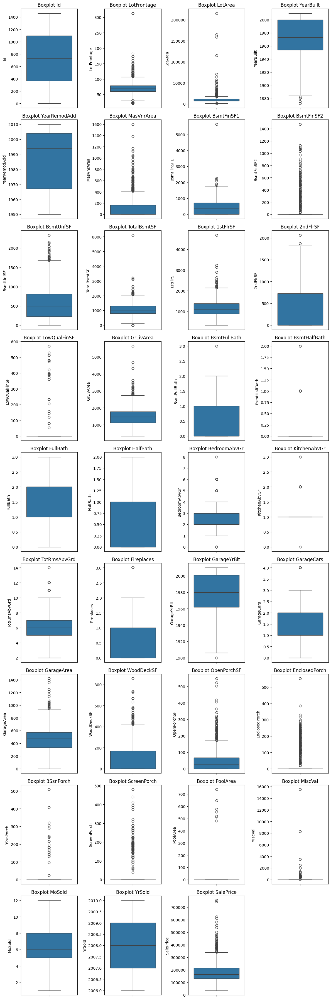

In [29]:
plot_boxplot(df_fix_duplicate, outlier_columns)

### **Mengatasi Outlier**

#### Mengatasi Outliers dengan Winsorization

Secara singkatnya methode ini akan mengganti nilai outlier dengan nilai maksimum atau minimum yang telah ditentukan.

In [30]:
def transform_outliersW(df, numeric_columns):
    df_copy = df.copy()
    
    for column in numeric_columns:
        q1 = df_copy[column].quantile(0.25)
        q3 = df_copy[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        
        if (df_copy[column] < lower_bound).any() or (df_copy[column] > upper_bound).any():
            values = df_copy[column].values
            winsorized_data = winsorize(values, limits=[0.05, 0.05])
            df_copy[column] = winsorized_data
        
    return df_copy

In [31]:
df_otcW = transform_outliersW(df_fix_duplicate, outlier_columns)

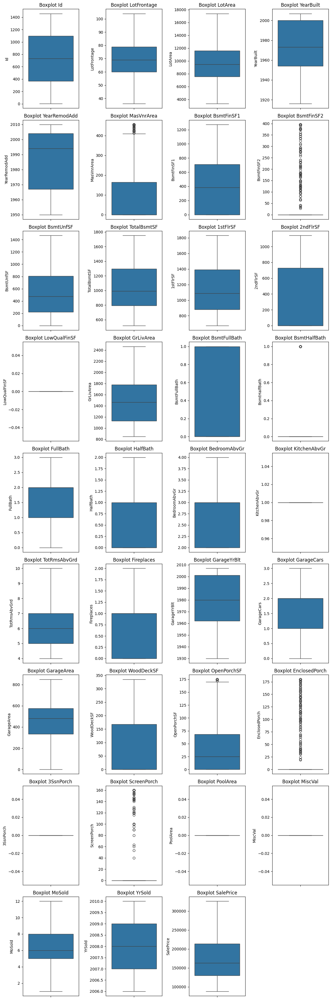

In [32]:
plot_boxplot(df_otcW, outlier_columns)

#### Mengatasi Outliers dengan Capping

Seacar singkatnya methode ini akan mengganti nilai yang berada di luar batas atas dan batas bawah dengan nilai batas atas dan batas bawah tersebut.

In [33]:
def transform_outliersC(df, target_columns):
    df_copy = df.copy()
    
    for column in target_columns:
        q1 = df_copy[column].quantile(0.25)
        q3 = df_copy[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        
        df_copy[column] = df_copy[column].clip(lower=lower_bound, upper=upper_bound)
        
    return df_copy


In [34]:
df_otcC = transform_outliersC(df_fix_duplicate, outlier_columns)

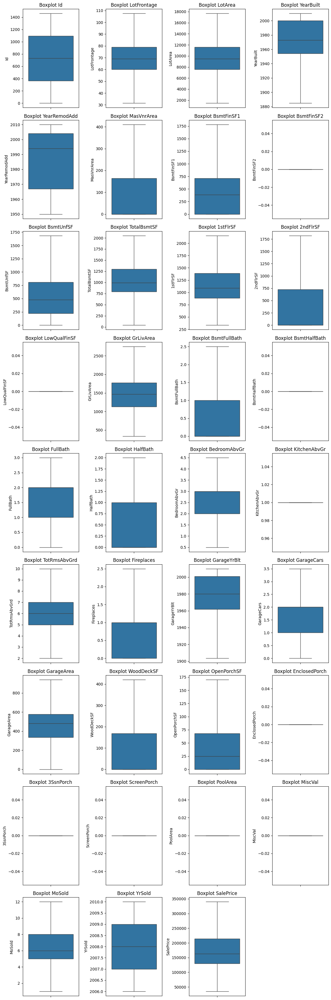

In [35]:
plot_boxplot(df_otcC, outlier_columns)

#### Hasil yang diambil

Metode Winsorization lebih cocok karena:

1. Efektivitas : Mengatasi outliers tanpa menghapus data sepenuhnya.
2. Mempertahankan Ukuran Sampel: Tidak mengurangi ukuran sampel secara signifikan.
3. Menghindari Bias: Mencegah bias yang mungkin terjadi dengan penghapusan data.
4. Fleksibel: Dapat disesuaikan dengan persentase pemotongan yang berbeda.

## **Memeriksa imbalance data dan menyelesaikan imbalance data jika ada.**

In [36]:
df_imbalance = df_otcW.copy()

### **Mencari Imbalance Data**

#### Histogram

In [37]:
def plot_numeric_columns_histogram_subplots(data, target_columns):
    if isinstance(target_columns, str):
        target_columns = [target_columns] 
        num_plots = 1 
    else:
        num_plots = len(target_columns)

    num_cols = 4
    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1

    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(36, 8))
    
    if isinstance(axes, np.ndarray):
        axes = axes.flatten()
    else:
        axes = [axes]

    for i, column in enumerate(target_columns):
        ax = axes[i]
        sns.histplot(data[column], kde=True, ax=ax, color='skyblue')
        ax.set_title(f'Histogram of {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')
        ax.grid(False)
    
    for i in range(num_plots, num_rows * num_cols):
        plt.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()


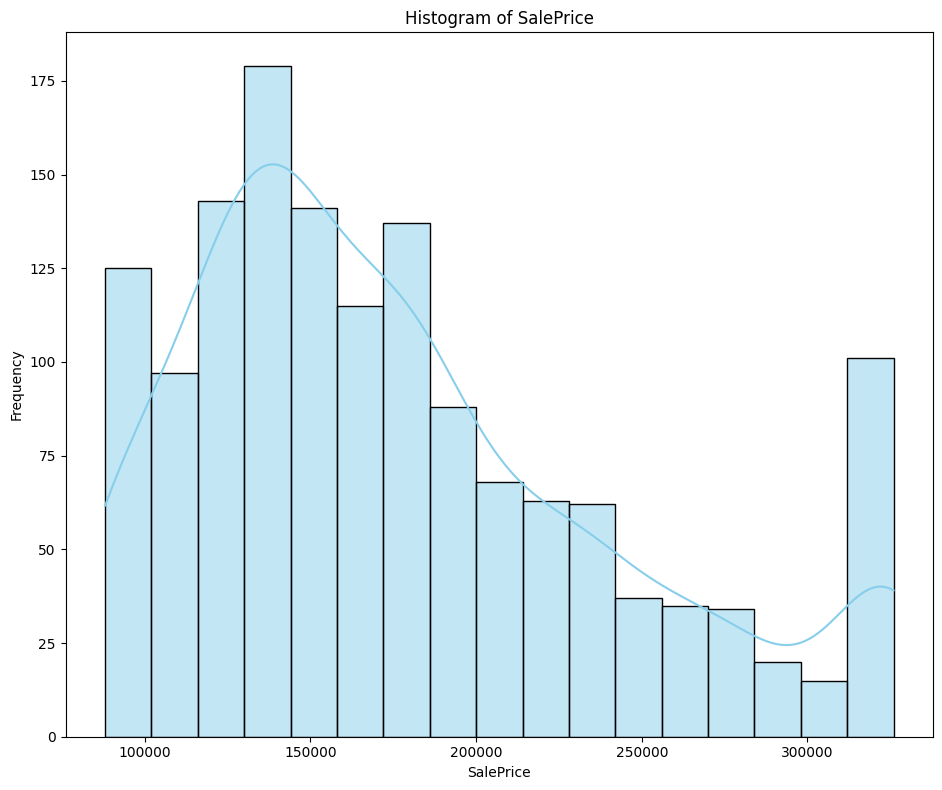

In [38]:
plot_numeric_columns_histogram_subplots(df_imbalance, target_columns)

#### Hitung Rasio Kelas Minoritas:Mayoritas

In [39]:
def calculate_class_imbalance_auto(df, columns, num_bins=10):
    categorical_columns = []
    continuous_columns = []

    for column in columns:
        if pd.api.types.is_categorical_dtype(df[column]) or pd.api.types.is_string_dtype(df[column]):
            categorical_columns.append(column)
        elif pd.api.types.is_numeric_dtype(df[column]):
            continuous_columns.append(column)

    imbalance_data = []

    for column in categorical_columns:
        class_counts = df[column].value_counts()
        minority_class_count = class_counts.min()
        majority_class_count = class_counts.max()
        imbalance_ratio = minority_class_count / majority_class_count
        imbalance_data.append([column, imbalance_ratio])

    for column in continuous_columns:
        bins = np.linspace(df[column].min(), df[column].max(), num_bins+1)
        categories = pd.cut(df[column], bins=bins, include_lowest=True)
        
        class_counts = categories.value_counts()
        
        minority_bin_count = class_counts.min()
        majority_bin_count = class_counts.max()
        imbalance_ratio = minority_bin_count / majority_bin_count

        imbalance_data.append([column, imbalance_ratio])

    imbalance_df = pd.DataFrame(imbalance_data, columns=['Column', 'Imbalance Ratio'])
    return imbalance_df


In [40]:
calculate_class_imbalance_auto(df_otcW, target_columns)

,Column,Imbalance Ratio
0,SalePrice,0.131783


### **Mengatasi Masalah Imbalance Data**

**Tidak diperlukan balancing data karena dataset dipersiapkan untuk model regresi. Sehingga tidak perlu mengatasi imbalance data karena regresi sendiri tidak bergantung pada kelas-kelas dalam fitur.**

## **Membuat class Encoder dan Decoder**

In [41]:
class AutoLabelEncoder:
    def __init__(self):
        self.encoders = {}

    def fit_transform(self, df):
        for column in df.columns:
            if df[column].dtype == 'category':
                encoder = LabelEncoder()
                df[column] = encoder.fit_transform(df[column])
                self.encoders[column] = {label: index for index, label in enumerate(encoder.classes_)}
        return df
    
    def transform(self, df):
        for column, encoder in self.encoders.items():
            if column in df.columns:
                df[column] = df[column].map(encoder).fillna(df[column])
        return df

    def inverse_transform(self, df):
        for column, encoder in self.encoders.items():
            if column in df.columns:
                reverse_encoder = {v: k for k, v in encoder.items()}
                df[column] = df[column].map(reverse_encoder).fillna(df[column])
        return df


In [42]:
auto_encoder = AutoLabelEncoder()
encoded_df = auto_encoder.fit_transform(df_imbalance.copy())

# **Exploratory Data Analysis (EDA)**

## **Load Dataset**

In [43]:
data_eda = df_otcW

## **Mengelaborasi Features dan Tipe Data**

In [44]:
data_eda.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,Without,IR1,Lvl,AllPub,...,0,Without,Without,Without,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,Without,IR1,Lvl,AllPub,...,0,Without,Without,Without,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,Without,IR1,Lvl,AllPub,...,0,Without,Without,Without,0,12,2008,WD,Normal,250000


In [45]:
data_eda.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,Without,Reg,Lvl,AllPub,...,0,Without,MnPrv,Without,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,Without,Reg,Lvl,AllPub,...,0,Without,GdPrv,Shed,0,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,6,2008,WD,Normal,147500


In [46]:
print("Informasi Dataset:")
data_eda.info()

Informasi Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             1460 non-null   int64   
 1   MSSubClass     1460 non-null   category
 2   MSZoning       1460 non-null   category
 3   LotFrontage    1460 non-null   float64 
 4   LotArea        1460 non-null   int64   
 5   Street         1460 non-null   category
 6   Alley          1460 non-null   category
 7   LotShape       1460 non-null   category
 8   LandContour    1460 non-null   category
 9   Utilities      1460 non-null   category
 10  LotConfig      1460 non-null   category
 11  LandSlope      1460 non-null   category
 12  Neighborhood   1460 non-null   category
 13  Condition1     1460 non-null   category
 14  Condition2     1460 non-null   category
 15  BldgType       1460 non-null   category
 16  HouseStyle     1460 non-null   category
 17  OverallQual   

### **Korelasi Features**

In [47]:
# Hitung korelasi Pearson
sales_corr = encoded_df.corr()

In [48]:
sales_corr

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,1.000000,0.018745,-0.006096,-0.029920,-0.005952,0.008916,-0.001530,0.032122,-0.019659,0.013324,...,NaN,-0.033928,-0.000399,0.037057,NaN,0.021172,0.000712,0.019773,-0.005806,-0.027520
MSSubClass,0.018745,1.000000,0.037785,-0.336639,-0.332512,-0.025737,-0.094916,0.090920,-0.007658,-0.026217,...,NaN,-0.015024,0.074567,0.033339,NaN,0.007052,-0.022100,0.020195,-0.033097,-0.054703
MSZoning,-0.006096,0.037785,1.000000,-0.123917,-0.080355,0.087654,-0.052039,0.061887,-0.017854,-0.001192,...,NaN,0.002882,-0.061289,0.000673,NaN,-0.031496,-0.020628,0.097437,0.009494,-0.208875
LotFrontage,-0.029920,-0.336639,-0.123917,1.000000,0.565205,-0.038488,0.167287,-0.138406,-0.007430,-0.000183,...,NaN,-0.085744,-0.051995,-0.011099,NaN,0.017479,0.006378,-0.043993,0.063964,0.376146
LotArea,-0.005952,-0.332512,-0.080355,0.565205,1.000000,-0.071402,0.111307,-0.300796,-0.058019,0.035422,...,NaN,-0.100447,0.008224,-0.058047,NaN,0.002504,-0.035450,-0.012891,0.050154,0.436556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MoSold,0.021172,0.007052,-0.031496,0.017479,0.002504,0.003690,0.013094,-0.033455,-0.011599,-0.051552,...,NaN,0.036368,-0.009892,-0.014193,NaN,1.000000,-0.145721,-0.047386,0.013320,0.069022
YrSold,0.000712,-0.022100,-0.020628,0.006378,-0.035450,-0.025043,0.020944,0.036449,0.020507,0.023353,...,NaN,0.060904,-0.035366,-0.055962,NaN,-0.145721,1.000000,-0.002327,0.003880,-0.028968
SaleType,0.019773,0.020195,0.097437,-0.043993,-0.012891,0.014339,0.008205,-0.000911,-0.025754,-0.126770,...,NaN,-0.013592,-0.006154,-0.003311,NaN,-0.047386,-0.002327,1.000000,0.184067,-0.044484
SaleCondition,-0.005806,-0.033097,0.009494,0.063964,0.050154,0.006064,0.035717,-0.038118,0.033809,-0.089701,...,NaN,0.097425,0.100675,0.003192,NaN,0.013320,0.003880,0.184067,1.000000,0.227129


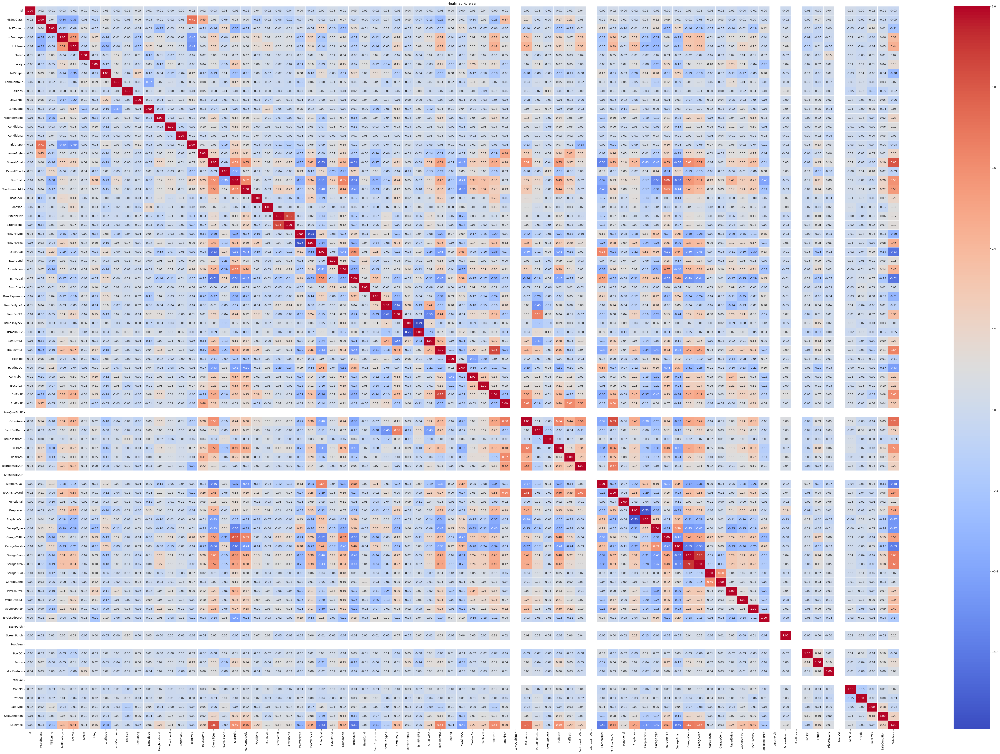

In [49]:
plt.figure(figsize=(72, 48))
sns.heatmap(sales_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap Korelasi')
plt.show()

In [50]:
high_corr_columns = sales_corr[(sales_corr > 0.7) & (sales_corr < 1)]

for col1 in high_corr_columns.index:
    for col2 in high_corr_columns.index:
        if col1 != col2 and sales_corr.loc[col1, col2] > 0.7:
            print(f"{col1} dan {col2} memiliki korelasi: {sales_corr.loc[col1, col2]}")

MSSubClass dan BldgType memiliki korelasi: 0.7124744102567905
BldgType dan MSSubClass memiliki korelasi: 0.7124744102567905
OverallQual dan SalePrice memiliki korelasi: 0.812369458889186
YearBuilt dan GarageYrBlt memiliki korelasi: 0.7988083089432334
Exterior1st dan Exterior2nd memiliki korelasi: 0.8541629837325787
Exterior2nd dan Exterior1st memiliki korelasi: 0.8541629837325787
TotalBsmtSF dan 1stFlrSF memiliki korelasi: 0.8513693143327102
1stFlrSF dan TotalBsmtSF memiliki korelasi: 0.8513693143327102
GrLivArea dan TotRmsAbvGrd memiliki korelasi: 0.8327039641030668
GrLivArea dan SalePrice memiliki korelasi: 0.7270458733276692
TotRmsAbvGrd dan GrLivArea memiliki korelasi: 0.8327039641030668
GarageYrBlt dan YearBuilt memiliki korelasi: 0.7988083089432334
GarageCars dan GarageArea memiliki korelasi: 0.8994870933524486
GarageArea dan GarageCars memiliki korelasi: 0.8994870933524486
SalePrice dan OverallQual memiliki korelasi: 0.812369458889186
SalePrice dan GrLivArea memiliki korelasi: 0

### **Univariate Analysis**

#### **Numerical Features**

In [51]:
def plot_numeric_columns_histogram_subplots(data):
    numeric_columns = data.select_dtypes(include='number').columns
    num_plots = len(numeric_columns)
    num_cols = 4
    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(30, 60))
    
    for i, column in enumerate(numeric_columns):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col]
        
        sns.histplot(data[column], kde=True, ax=ax, color='skyblue')
        ax.set_title(f'Histogram of {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')
        ax.grid(False)
    
    for i in range(num_plots, num_rows * num_cols):
        plt.delaxes(plt.subplot(num_rows, num_cols, i + 1))
    
    plt.show()

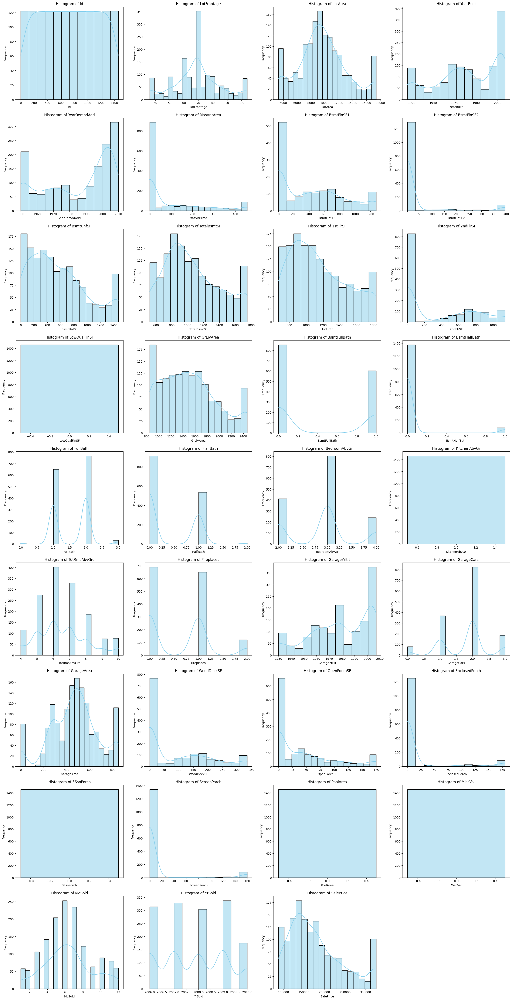

In [52]:
plot_numeric_columns_histogram_subplots(data_eda)

#### **Categorical Features**

In [53]:
def plot_categorical_histograms(df, figsize=(40, 86)): 
    num_cols = 3
    object_columns = df.select_dtypes(include='category').columns
    num_plots = len(object_columns)
    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1

    fig = plt.figure(figsize=figsize)
    plot_count = 0 
    
    for i, column in enumerate(object_columns):
        if df[column].nunique() > 10:
            figsize_custom = (24, 12)
            plt.figure(figsize=figsize_custom)
            sns.countplot(data=df, x=column, color='skyblue')
            plt.title(f'Count Plot {column}')
            plt.tight_layout()
            continue  
        else:
            plot_count += 1
            ax = fig.add_subplot(num_rows, num_cols, plot_count)
            sns.countplot(data=df, x=column, ax=ax, color='skyblue')
            ax.set_title(f'Count Plot {column}')       
    for i in range(num_plots, num_rows * num_cols):
        plt.delaxes(plt.subplot(num_rows, num_cols, i + 1))
        
    plt.tight_layout()
    plt.show()

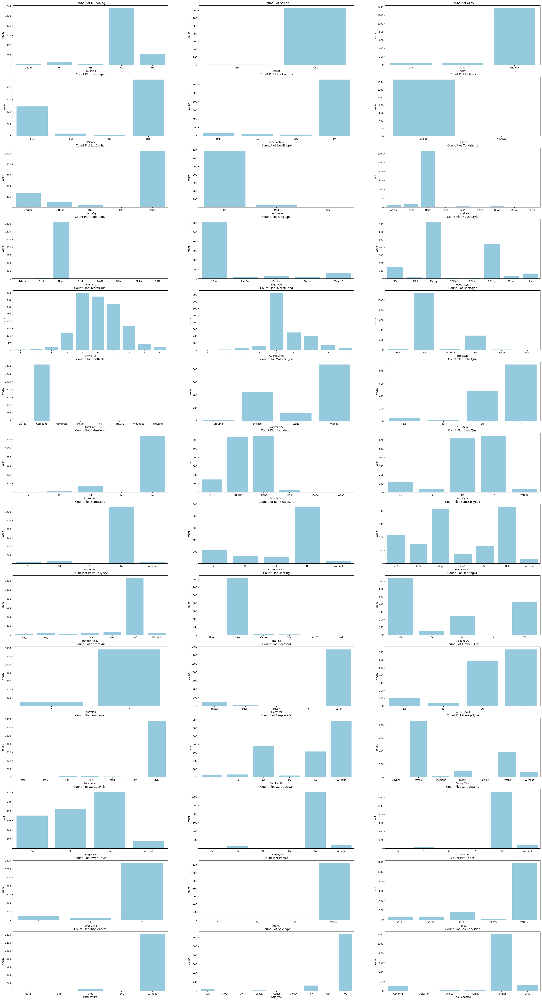

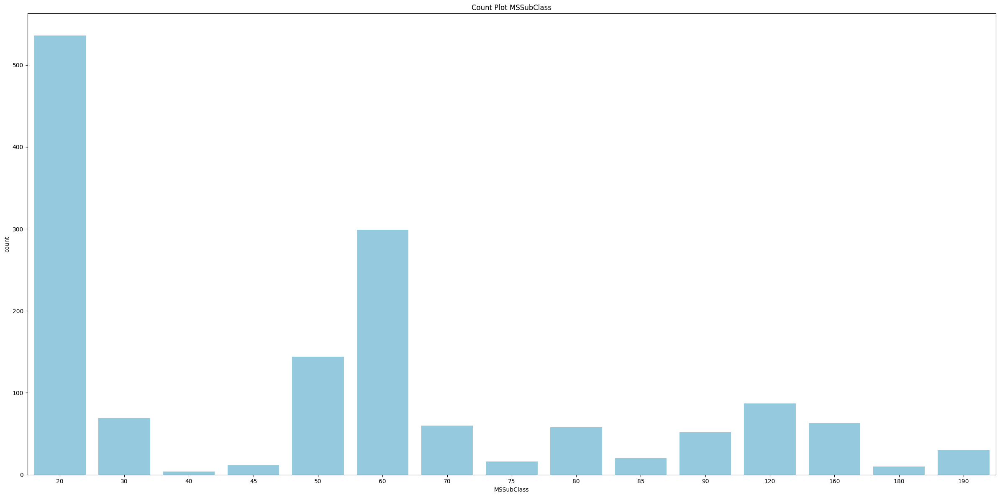

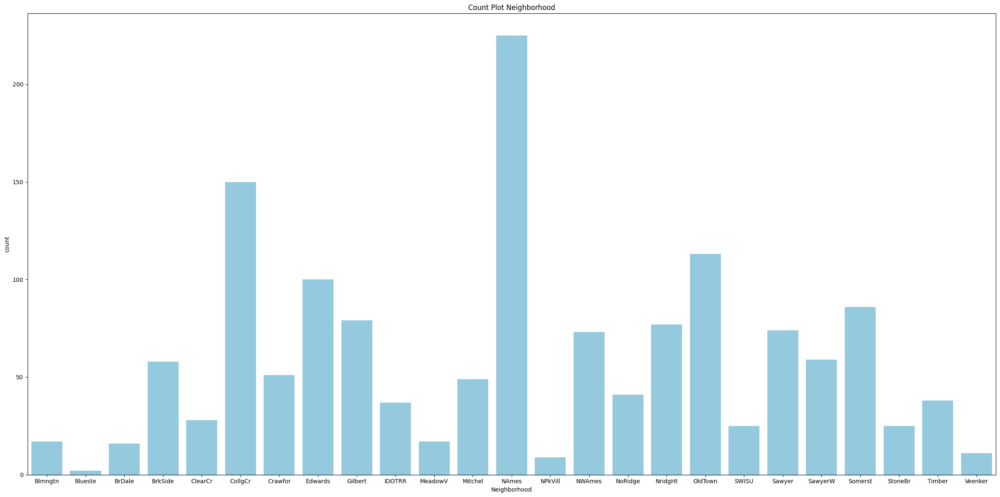

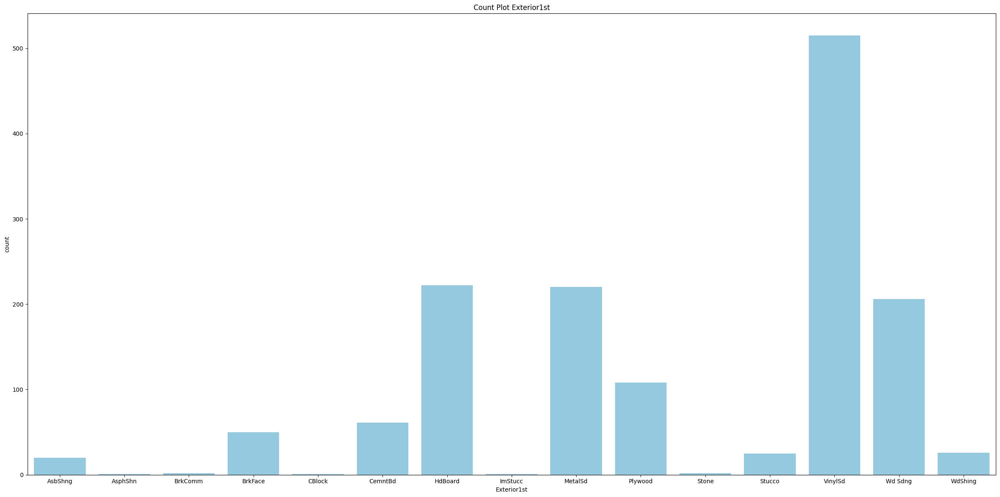

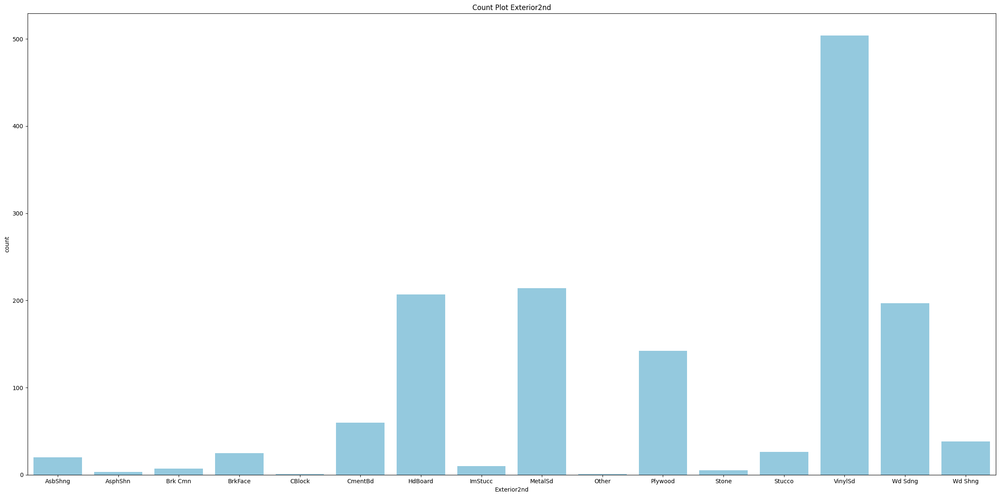

In [54]:
plot_categorical_histograms(data_eda)

### **Bi/Mul Variate Analysis**

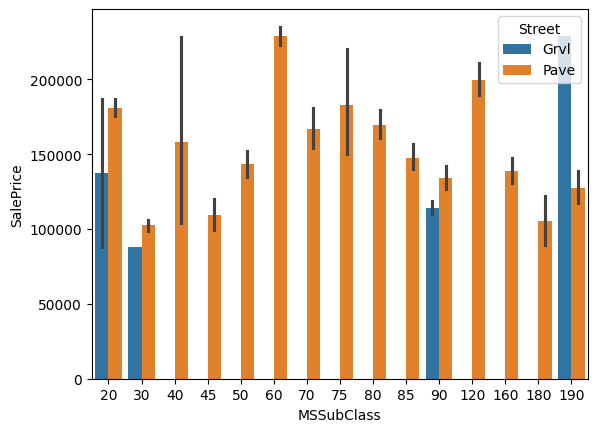

In [55]:
ax = sns.barplot(x="MSSubClass", y="SalePrice", hue="Street", data=data_eda)

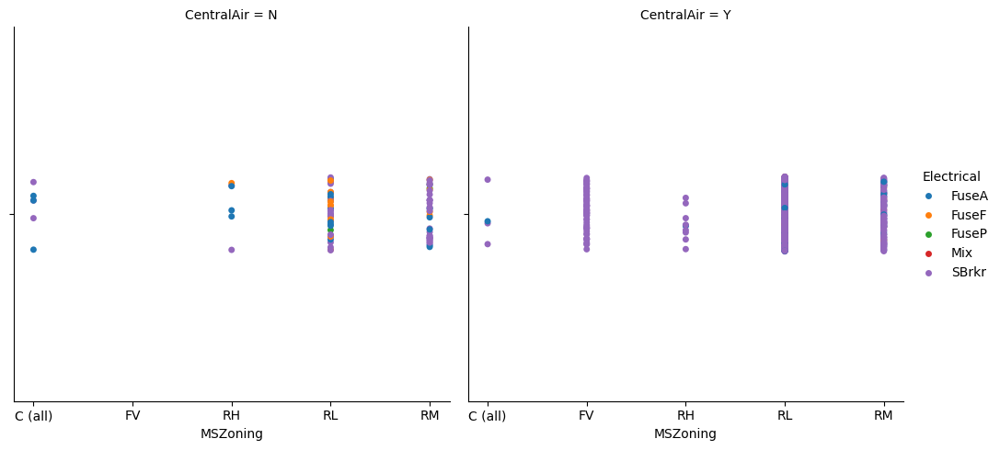

In [56]:
ax = sns.catplot(x='MSZoning', data=data_eda, col='CentralAir', hue='Electrical')

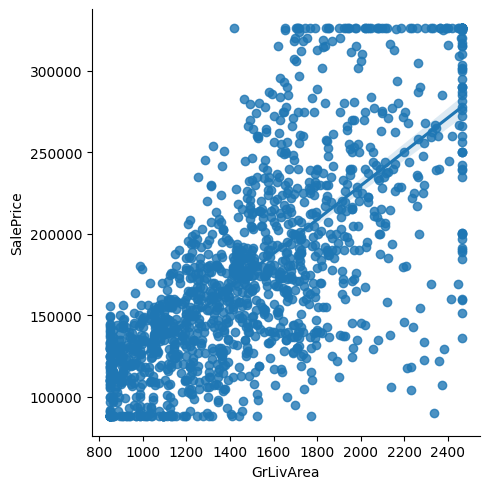

In [57]:
ax = sns.lmplot(x="GrLivArea", y="SalePrice", data=data_eda,)

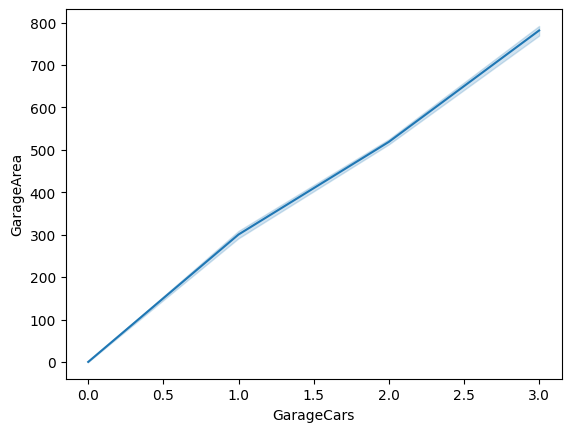

In [58]:
ax = sns.lineplot(x="GarageCars", y="GarageArea", data=data_eda)

## **Mean, Median, dan Modus**

`Mean`, `median`, dan `modus` adalah tiga metrik statistik yang digunakan untuk menggambarkan data secara deskriptif.

- **Mean** adalah jumlah dari semua nilai dalam kumpulan data dibagi dengan total jumlah nilai. `Mean` sering digunakan sebagai ukuran pusat yang paling umum, namun rentan terhadap pengaruh nilai ekstrem atau outlier. Jika ada outlier, mean dapat menjadi tidak representatif. Meskipun demikian, `mean` cocok digunakan untuk data yang terdistribusi normal atau mendekati normal.

- **Median** adalah nilai tengah dalam kumpulan data setelah diurutkan secara berurutan. `Median` tidak dipengaruhi oleh nilai ekstrem atau outlier, sehingga lebih stabil daripada `mean`. Karena itu, `median` lebih disukai untuk data yang memiliki distribusi yang miring (skewed) atau ketika ada nilai ekstrem.

- **Modus** adalah nilai yang paling sering muncul dalam kumpulan data. `Modus` dapat memiliki lebih dari satu nilai (multi-modal) jika ada beberapa nilai yang memiliki frekuensi yang sama. `Modus` berguna terutama untuk data kategorikal, tetapi juga dapat diterapkan pada data numerik.

Perbedaan utama antara ketiganya terletak pada cara mereka menangani nilai ekstrem dan distribusi data. `Mean` dapat dipengaruhi oleh nilai ekstrem, `median` lebih tahan terhadap nilai ekstrem, sementara `modus` hanya memperhatikan nilai yang paling sering muncul tanpa memperhatikan nilai numerik secara keseluruhan.


### **Data Numerik**

In [59]:
numeric_columns = df_otcC.select_dtypes(include=['int', 'float']).columns

modus_func = lambda x: x.mode().iloc[0]

aggregate_stats = df_otcC[numeric_columns].agg(['mean', 'median'])
aggregate_stats.loc['modus'] = df_otcC[numeric_columns].apply(modus_func)

print("Statistik Agregat:")
aggregate_stats

Statistik Agregat:


,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
mean,730.5,69.090411,9647.388014,1971.299315,1984.865753,89.406336,439.997517,0.0,563.77774,1050.254795,...,91.806849,42.603425,0.0,0.0,0.0,0.0,0.0,6.321918,2007.815753,177331.52637
median,730.5,69.000000,9478.500000,1973.000000,1994.000000,0.000000,383.500000,0.0,477.50000,991.500000,...,0.000000,25.000000,0.0,0.0,0.0,0.0,0.0,6.000000,2008.000000,163000.00000
modus,1.0,69.000000,17673.500000,2006.000000,1950.000000,0.000000,0.000000,0.0,0.00000,42.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,6.000000,2009.000000,340037.50000


### **Data Kategorikal**

In [60]:
categorical_columns = df_otcC.select_dtypes(include=['category']).columns

modus_func = lambda x: x.mode().iloc[0]

mode_and_frequency = df_otcC[categorical_columns].apply(lambda x: (x.mode().iloc[0], len(x[x == x.mode().iloc[0]])))

print("Modus dan Frekuensi untuk Kolom Kategorikal:")
mode_and_frequency

Modus dan Frekuensi untuk Kolom Kategorikal:


,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,20,RL,Pave,Without,Reg,Lvl,AllPub,Inside,Gtl,NAmes,...,Attchd,Unf,TA,TA,Y,Without,Without,Without,WD,Normal
1,536,1151,1454,1369,925,1311,1459,1052,1382,225,...,870,605,1311,1326,1340,1453,1179,1406,1267,1198


## **Statistical Five Summaries**


Statistical Five Summaries adalah alat analisis data eksploratif yang memberikan insight tentang distribusi nilai untuk suatu fitur. Secara kolektif, kumpulan statistik ini menjelaskan di mana nilai-nilai data terjadi, kecenderungan pusat, variabilitas, dan bentuk umum distribusinya.

### **Data Numerik**

In [61]:
print("\nLima Ringkasan Statistik untuk Fitur Numerik:")
data_eda.describe().loc[['min', '25%', '50%', '75%', 'max']]


Lima Ringkasan Statistik untuk Fitur Numerik:


,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
min,1.00,36.0,3316.0,1916.0,1950.0,0.00,0.00,0.0,0.0,520.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2006.0,88000.0
25%,365.75,60.0,7553.5,1954.0,1967.0,0.00,0.00,0.0,223.0,795.75,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,129975.0
50%,730.50,69.0,9478.5,1973.0,1994.0,0.00,383.50,0.0,477.5,991.50,...,0.0,25.0,0.0,0.0,0.0,0.0,0.0,6.0,2008.0,163000.0
75%,1095.25,79.0,11601.5,2000.0,2004.0,164.25,712.25,0.0,808.0,1298.25,...,168.0,68.0,0.0,0.0,0.0,0.0,0.0,8.0,2009.0,214000.0
max,1460.00,104.0,17400.0,2007.0,2010.0,456.00,1274.00,396.0,1468.0,1753.00,...,335.0,175.0,180.0,0.0,160.0,0.0,0.0,12.0,2010.0,326000.0


### **Data Kategorik**

In [62]:
print("\nEmpat Ringkasan Statistik untuk Fitur Kategorial:")
data_eda.describe(include=["category"])


Empat Ringkasan Statistik untuk Fitur Kategorial:


,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,...,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460
unique,15,5,2,3,4,4,2,5,3,25,...,7,4,6,6,3,4,5,5,9,6
top,20,RL,Pave,Without,Reg,Lvl,AllPub,Inside,Gtl,NAmes,...,Attchd,Unf,TA,TA,Y,Without,Without,Without,WD,Normal
freq,536,1151,1454,1369,925,1311,1459,1052,1382,225,...,870,605,1311,1326,1340,1453,1179,1406,1267,1198


## **Distribusi Data**

### **Standar Deviasi**

In [63]:
data_eda.describe().loc[['std']]

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
std,421.610009,16.503986,3469.444734,28.872129,20.645407,140.590668,412.214952,100.533075,414.582219,346.847701,...,109.391899,53.137989,50.361671,0.0,40.117506,0.0,0.0,2.703626,1.328095,64551.108307


### **Visualisasi**

In [64]:
def plot_distribution_plot_subplots(data):
    numeric_columns = data.select_dtypes(include='number').columns
    num_plots = len(numeric_columns)
    num_cols = 3
    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(24, 96))
    
    for i, column in enumerate(numeric_columns):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col]
        
        sns.kdeplot(data[column], ax=ax, color='skyblue', fill=True)
        ax.set_title(f'Distribusi {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Density')
        ax.grid(False)
    
    for i in range(num_plots, num_rows * num_cols):
        plt.delaxes(plt.subplot(num_rows, num_cols, i + 1))
    
    plt.show()


Visualisasi Distribusi Data dari Setiap Kolom:


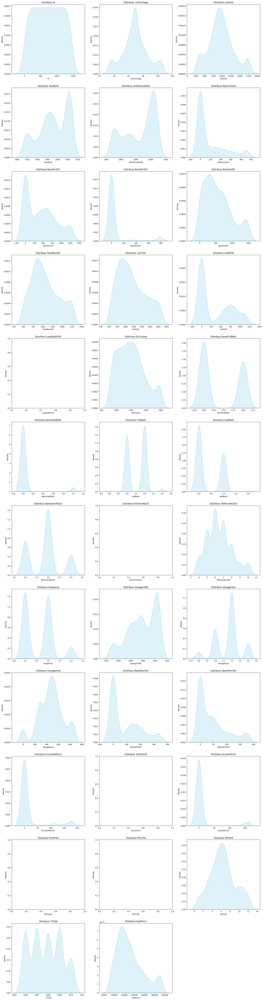

In [65]:
print("\nVisualisasi Distribusi Data dari Setiap Kolom:")
plot_distribution_plot_subplots(data_eda)

### **Memeriksa Distribusi Fitur**

In [66]:
for nama_kolom in data_eda.select_dtypes(include='number').columns:
    print(f"{nama_kolom}")
    
    # Hitung skewness
    skewness = skew(data_eda[nama_kolom])
    print(f"Skewness: {skewness}")


    p_value = norm.sf(abs(skewness))
    if p_value < 0.05:
        print(f"Skewness dari {nama_kolom} signifikan (p-value={p_value}), menunjukkan distribusi tidak normal.")
    else:
        print(f"Skewness dari {nama_kolom} tidak signifikan (p-value={p_value}), menunjukkan distribusi normal.")

    print("\n")

Id
Skewness: 0.0
Skewness dari Id tidak signifikan (p-value=0.5), menunjukkan distribusi normal.


LotFrontage
Skewness: 0.11242459971057116
Skewness dari LotFrontage tidak signifikan (p-value=0.4552433756106172), menunjukkan distribusi normal.


LotArea
Skewness: 0.31233436352585764
Skewness dari LotArea tidak signifikan (p-value=0.3773932135242946), menunjukkan distribusi normal.


YearBuilt
Skewness: -0.44224844191989515
Skewness dari YearBuilt tidak signifikan (p-value=0.32915471773241045), menunjukkan distribusi normal.


YearRemodAdd
Skewness: -0.5030444967597948
Skewness dari YearRemodAdd tidak signifikan (p-value=0.3074664940394669), menunjukkan distribusi normal.


MasVnrArea
Skewness: 1.3937494017550265
Skewness dari MasVnrArea tidak signifikan (p-value=0.08169664619837869), menunjukkan distribusi normal.


BsmtFinSF1
Skewness: 0.5409206038974297
Skewness dari BsmtFinSF1 tidak signifikan (p-value=0.2942811543554712), menunjukkan distribusi normal.


BsmtFinSF2
Skewness: 2.998

C:\Users\HP Pavilion\AppData\Local\Temp\ipykernel_14784\310592348.py:5: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skewness = skew(data_eda[nama_kolom])


# **Feature Engineering**

## **Load Dataset**

In [67]:
# Membaca dataset
data = df_otcW.copy()

## **Pembuatan Fitur Baru**

### **Agregasi**

In [68]:
# Fitur baru: TotalBuildingSF
data['TotalBuildingSF'] = data['1stFlrSF'] + data['2ndFlrSF'] + data['TotalBsmtSF']


Insight: 
* Fitur ini menunjukkan total luas bangunan yang terdiri dari luas lantai pertama, lantai kedua, dan luas basement.
* Semakin besar nilai TotalBuildingSF, semakin besar ukuran keseluruhan bangunan.

In [69]:
# Fitur baru: TotalBathrooms
data['TotalBathrooms'] = (data['FullBath'] + data['HalfBath']) + (data['BsmtFullBath'] + data['BsmtHalfBath'])

Insight: 
* Fitur ini menunjukkan jumlah total kamar mandi di atas dan di bawah grade.
* Semakin besar nilai TotalBathrooms, semakin banyak kamar mandi yang tersedia di properti tersebut.

In [70]:
# Fitur baru: TotalStreetFrontage
outdoor_features = ['LotFrontage','WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch']
data['TotalStreetFrontage'] = data[outdoor_features].sum(axis=1)

Insight: 
* Fitur ini menunjukkan total panjang garis depan properti, termasuk panjang garis depan dari garasi dan teras.
* Semakin besar nilai TotalStreetFrontage, semakin besar panjang garis depan properti.

In [71]:
# Fitur baru: MainFloorBathrooms
data['MainFloorBathrooms'] = data['FullBath'] + data['HalfBath']

Insight: 
* Fitur ini menunjukkan jumlah total kamar mandi di lantai pertama.
* Mengetahui jumlah kamar mandi di lantai pertama dapat memberikan gambaran tentang kenyamanan dan fungsionalitas rumah.

In [72]:
# Fitur baru: MainFloorRatio
data['MainFloorRatio'] = data['1stFlrSF'] / data['TotalBuildingSF']

Insight: 
* Fitur ini menunjukkan rasio antara luas lantai pertama dengan total luas bangunan.
* Rasio yang lebih tinggi menunjukkan proporsi yang lebih besar dari bangunan yang berada di lantai pertama.

In [73]:
# Fitur baru: LivingAreaPerRoom
data['LivingAreaPerRoom'] = data['GrLivArea'] / data['TotRmsAbvGrd']

Insight: 
* Fitur ini menunjukkan rata-rata luas area tinggal per ruangan di atas grade.
* Semakin besar nilai LivingAreaPerRoom, semakin besar ruang yang tersedia per ruangan.

In [74]:
# Fitur baru: GarageAreaPerCar
data['GarageAreaPerCar'] = data['GarageArea'] / data['GarageCars']
data['GarageAreaPerCar'] = data['GarageAreaPerCar'].fillna(0)

Insight
* Fitur ini menunjukkan rata-rata luas gudang per mobil.
* Semakin besar nilai GarageAreaPerCar, semakin banyak ruang yang tersedia untuk setiap mobil di gudang.

### **Transformasi**

In [75]:
# Fitur baru: PropertyAge
data['PropertyAge'] = data['YrSold'] - data['YearBuilt']

Insight
* Fitur ini menunjukkan usia properti pada saat penjualan.
* Semakin besar nilai PropertyAge, semakin tua properti tersebut.

In [76]:
# Fitur baru: GarageAge
data['GarageAge'] = data['YrSold'] - data['GarageYrBlt']

Insight
* Fitur ini menunjukkan usia garasi pada saat penjualan.
* Semakin besar nilai GarageAge, semakin tua garasi tersebut.

In [77]:
# Fitur baru: PorchType
porch_types = []
for index, row in data.iterrows():
    if row['OpenPorchSF'] > 0 or row['EnclosedPorch'] > 0:
        porch_types.append('Covered')
    elif row['ScreenPorch'] > 0:
        porch_types.append('Screened')
    else:
        porch_types.append('Without')

data['PorchType'] = porch_types
data['PorchType'] = data['PorchType'].astype('category')

Insight: 
* Fitur ini menunjukkan jenis teras yang dimiliki oleh properti, apakah tertutup (Covered), terlindungi(Screened), atau tanpa teras (Without).
* Mengetahui jenis teras dapat memberikan gambaran tentang ruang outdoor yang tersedia dan tingkat kenyamanan untuk beraktivitas di luar ruangan.

### **Ekstraksi**

In [78]:
# Fitur baru: Remodeled
data['Remodeled'] = (data['YearBuilt'] != data['YearRemodAdd']).astype(int)

Insight:
* Fitur ini menunjukkan apakah rumah telah direnovasi sebelum penjualan atau tidak.
* Mengetahui apakah rumah telah direnovasi dapat memberikan informasi tambahan tentang kondisi dan nilai properti.

In [79]:
# Fitur baru: BuildingRating
data['BuildingRating'] = np.ceil((data['OverallQual'].astype(int) + data['OverallCond'].astype(int)) / 2).astype(int)


Insight: 
* Fitur ini menunjukkan penilaian keseluruhan rumah, dihitung sebagai nilai rata-rata dari OverallQual dan OverallCond, yang dibulatkan ke atas.
* Semakin tinggi nilai BuildingRating, semakin tinggi penilaian bangunan rumah.

### **Tampilkan**

In [80]:
data.iloc[:, -15:]

,SaleType,SaleCondition,SalePrice,TotalBuildingSF,TotalBathrooms,TotalStreetFrontage,MainFloorBathrooms,MainFloorRatio,LivingAreaPerRoom,GarageAreaPerCar,PropertyAge,GarageAge,PorchType,Remodeled,BuildingRating
0,WD,Normal,208500,2566,4,126.0,3,0.333593,213.750000,274.000000,5,5.0,Covered,0,6
1,WD,Normal,181500,2524,3,378.0,2,0.500000,210.333333,230.000000,31,31.0,Without,0,7
2,WD,Normal,223500,2706,4,110.0,3,0.339985,297.666667,304.000000,7,7.0,Covered,1,6
3,WD,Abnorml,140000,2473,2,275.0,1,0.388597,245.285714,214.000000,90,8.0,Covered,1,6
4,WD,Normal,250000,3343,4,360.0,3,0.342507,244.222222,278.666667,8,8.0,Covered,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,WD,Normal,175000,2600,3,102.0,3,0.366538,235.285714,230.000000,8,8.0,Covered,1,6
1456,WD,Normal,210000,3373,3,420.0,2,0.542840,296.142857,250.000000,32,32.0,Without,1,6
1457,WD,Normal,266500,3481,2,126.0,2,0.341281,260.000000,252.000000,69,69.0,Covered,1,8
1458,WD,Normal,142125,2156,2,515.0,1,0.500000,215.600000,240.000000,60,60.0,Covered,1,6


# **Machine Learning Regression Model**

Seperti yang telah dijelaskan pada Data Preparation, dataset ini akan digunakan untuk membangun model `regresi`. Oleh karena itu, kita akan membandingkan beberapa algoritma regresi untuk memprediksi harga penjualan rumah dengan target column `SalePrice`.

## **Library**

In [81]:
#pip install xgboost

In [82]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.linear_model import Ridge, Lasso, ElasticNet
import xgboost as xgb
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold, learning_curve, cross_validate

## **Fixing Outliers Features Engineering**

### **Pilih Fitur Numerical**

In [83]:
data_columns = ['TotalBuildingSF','TotalBathrooms','TotalStreetFrontage','MainFloorRatio','LivingAreaPerRoom', 'PropertyAge', 'GarageAge', 'GarageAreaPerCar','BuildingRating']

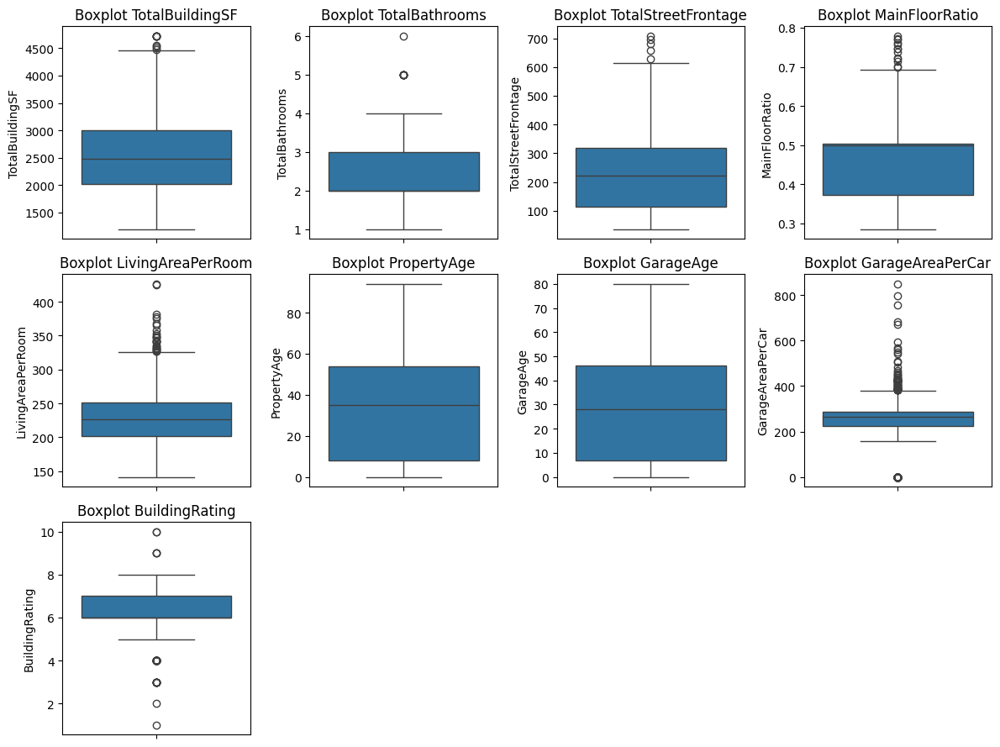

In [84]:
plot_boxplot(data,data_columns, figsize=(12, 9))

### **Mengatasi Outliers dengan Winsorize**

In [85]:
data_fix = transform_outliersW(data, data_columns)

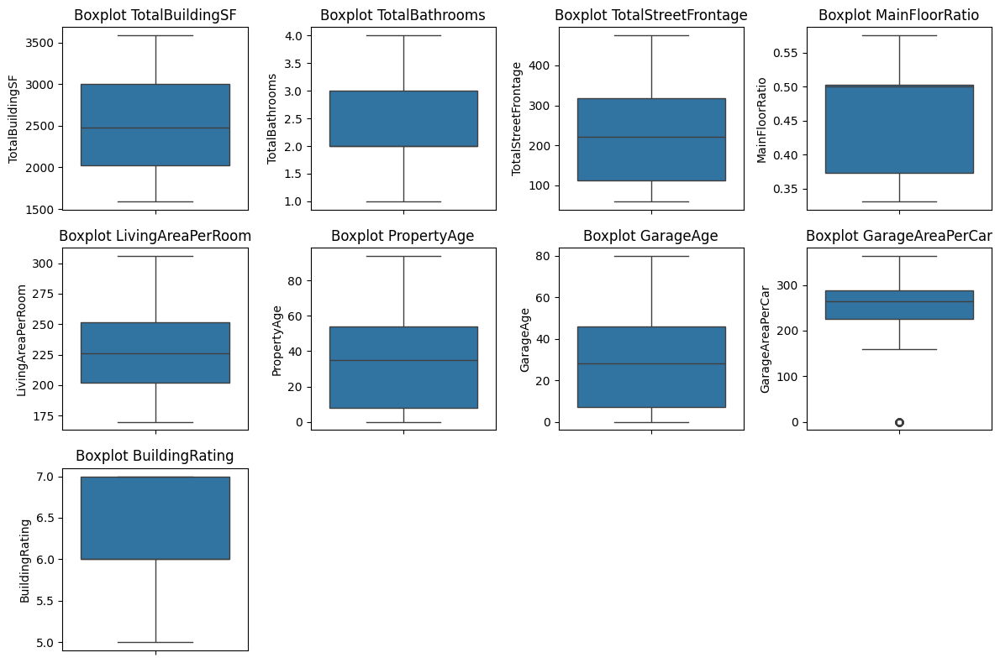

In [86]:
plot_boxplot(data_fix, data_columns, figsize=(12, 8))

## **Fixing Data Encoding**

In [87]:
data_fix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 93 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Id                   1460 non-null   int64   
 1   MSSubClass           1460 non-null   category
 2   MSZoning             1460 non-null   category
 3   LotFrontage          1460 non-null   float64 
 4   LotArea              1460 non-null   int64   
 5   Street               1460 non-null   category
 6   Alley                1460 non-null   category
 7   LotShape             1460 non-null   category
 8   LandContour          1460 non-null   category
 9   Utilities            1460 non-null   category
 10  LotConfig            1460 non-null   category
 11  LandSlope            1460 non-null   category
 12  Neighborhood         1460 non-null   category
 13  Condition1           1460 non-null   category
 14  Condition2           1460 non-null   category
 15  BldgType             

In [88]:
data_encoded = data_fix.copy()

### **Convert to Default Type**

In [89]:
data_encoded[['MSSubClass', 'OverallQual', 'OverallCond']] = data[['MSSubClass', 'OverallQual', 'OverallCond']].astype(int)

### **Ordinal Encoding**

In [90]:
ordinal_encoders = {
    "ExterQual": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1},
    "ExterCond": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1},
    "BsmtQual": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "BsmtCond": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "BsmtExposure": {"Gd": 4, "Av": 3, "Mn": 2, "No": 1, "Without": 0},
    "BsmtFinType1": {"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2, "Unf": 1, "Without": 0},
    "BsmtFinType2": {"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2, "Unf": 1, "Without": 0},
    "HeatingQC": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1},
    "KitchenQual": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1},
    "Functional": {"Typ": 8, "Min1": 7, "Min2": 6, "Mod": 5, "Maj1": 4, "Maj2": 3, "Sev": 2, "Sal": 1},
    "FireplaceQu": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "GarageQual": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "GarageCond": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "GarageFinish": {"Fin": 3, "RFn": 2, "Unf": 1, "Without": 0},
    "PoolQC": {"Ex": 4, "Gd": 3, "TA": 2, "Fa": 1, "Without": 0},
    "Fence": {"GdPrv": 4, "MnPrv": 3, "GdWo": 2, "MnWw": 1, "Without": 0},
}

In [91]:
def apply_ordinal_encoding(data, ordinal_encoders):
    for column, mapping in ordinal_encoders.items():
        if column in data.columns:
            data[column] = data[column].map(mapping)
    return data

df_encoded = apply_ordinal_encoding(data_encoded, ordinal_encoders)

# # List nama kolom yang akan ditampilkan
# kolom_yang_ingin_ditampilkan = list(ordinal_encoders.keys())

# # Tampilkan DataFrame hanya dengan kolom-kolom yang dipilih
# df_subset = data_encoded[kolom_yang_ingin_ditampilkan]
# df_subset

### **Label Encoding**

In [92]:
data_encoded = auto_encoder.fit_transform(data_encoded.copy())

## **Fitur Selecting**

### **Correlation Matrix**

In [93]:
sales_correlation = data_encoded.corr()

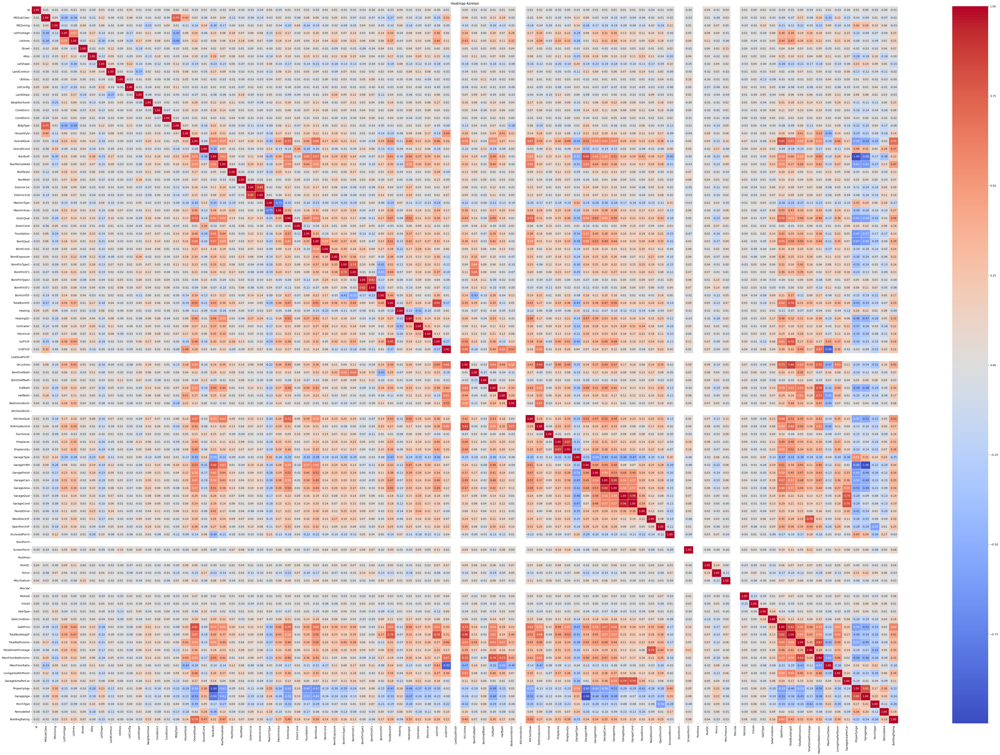

In [94]:
plt.figure(figsize=(72, 48))
sns.heatmap(sales_correlation, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap Korelasi')
plt.show()

### **Feature Importance**

In [95]:
positive_correlations = sales_correlation[(sales_correlation['SalePrice'] > 0.3) & (sales_correlation['SalePrice'] < 1)]
negative_correlations = sales_correlation[sales_correlation['SalePrice'] < -0.3]

positive_relevant_columns = positive_correlations.index
positive_correlation_values = positive_correlations['SalePrice']

negative_relevant_columns = negative_correlations.index
negative_correlation_values = negative_correlations['SalePrice']


In [96]:
print("Korelasi Positif:")
for column, correlation_value in zip(positive_relevant_columns, positive_correlation_values):
    print(f"Fitur: {column}, Correlation with SalePrice: {correlation_value}")

Korelasi Positif:
Fitur: LotFrontage, Correlation with SalePrice: 0.3761462111437718
Fitur: LotArea, Correlation with SalePrice: 0.43655559628357055
Fitur: OverallQual, Correlation with SalePrice: 0.812369458889186
Fitur: YearBuilt, Correlation with SalePrice: 0.5854580739948182
Fitur: YearRemodAdd, Correlation with SalePrice: 0.5520260204272455
Fitur: MasVnrArea, Correlation with SalePrice: 0.4495972992574466
Fitur: ExterQual, Correlation with SalePrice: 0.7003659630588421
Fitur: Foundation, Correlation with SalePrice: 0.4156237364602366
Fitur: BsmtQual, Correlation with SalePrice: 0.6496504228191562
Fitur: BsmtExposure, Correlation with SalePrice: 0.364509986431366
Fitur: BsmtFinType1, Correlation with SalePrice: 0.31871303519145205
Fitur: BsmtFinSF1, Correlation with SalePrice: 0.3646052249791405
Fitur: TotalBsmtSF, Correlation with SalePrice: 0.6441123191676862
Fitur: HeatingQC, Correlation with SalePrice: 0.45890312546577916
Fitur: 1stFlrSF, Correlation with SalePrice: 0.612267475

In [97]:
print("\nKorelasi Negatif:")
for column, correlation_value in zip(negative_relevant_columns, negative_correlation_values):
    print(f"Fitur: {column}, Correlation with SalePrice: {correlation_value}")


Korelasi Negatif:
Fitur: MasVnrType, Correlation with SalePrice: -0.30371242919311525
Fitur: GarageType, Correlation with SalePrice: -0.467747197553237
Fitur: PropertyAge, Correlation with SalePrice: -0.5858079486182214
Fitur: GarageAge, Correlation with SalePrice: -0.5129492526891238
Fitur: PorchType, Correlation with SalePrice: -0.33255523482120086


In [98]:
featuresX = positive_relevant_columns.to_list()

Dalam kasus dataset `Housing Prices Competition`, kita hanya menggunakan fitur yang berkorelasi positif dengan fitur `SalePrice`. 

Keputusan ini dapat membantu model untuk fokus pada fitur independen yang memiliki pola yang lebih signifikan dengan fitur `SalePrice`. 
Selain itu, fitur independen dengan korelasi positif memberikan informasi yang konsisten dan sejalan dengan fitur `SalePrice` sehingga pembelajaran model akan lebih efektif. Mengurangi kompleksitas model dengan memilih fitur independen dengan korelasi positif juga dapat membantu mengurangi overfitting dan meningkatkan pemahaman model.

## **Splitting Data**

### **Split Data to X and y**

In [99]:
df_encoded = pd.DataFrame(data_encoded)

y = df_encoded[target_columns]
X = df_encoded[featuresX]

In [100]:
y

,SalePrice
0,208500
1,181500
2,223500
3,140000
4,250000
...,...
1455,175000
1456,210000
1457,266500
1458,142125


In [101]:
X

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,TotalBuildingSF,TotalBathrooms,TotalStreetFrontage,MainFloorBathrooms,LivingAreaPerRoom,BuildingRating
0,65.0,8450,7,2003,2003,196.0,2,2,3,1,...,2,548,0,61,2566,4,126.0,3,213.750000,6
1,80.0,9600,6,1976,1976,0.0,1,1,3,4,...,2,460,298,0,2524,3,378.0,2,210.333333,7
2,68.0,11250,7,2001,2002,162.0,2,2,3,2,...,2,608,0,42,2706,4,110.0,3,297.666667,6
3,60.0,9550,7,1916,1970,0.0,1,0,2,1,...,3,642,0,35,2473,2,275.0,1,245.285714,6
4,84.0,14260,8,2000,2000,350.0,2,2,3,3,...,3,836,192,84,3343,4,360.0,3,244.222222,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,62.0,7917,6,1999,2000,0.0,1,2,3,1,...,2,460,0,40,2600,3,102.0,3,235.285714,6
1456,85.0,13175,6,1978,1988,119.0,1,1,3,1,...,2,500,335,0,3373,3,420.0,2,296.142857,6
1457,66.0,9042,7,1941,2006,0.0,3,4,2,1,...,1,252,0,60,3481,2,126.0,2,260.000000,7
1458,68.0,9717,5,1950,1996,0.0,1,1,2,2,...,1,240,335,0,2156,2,475.0,1,215.600000,6


### **Split Data to Train and Test 80:20**

In [102]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [103]:
X_train

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,TotalBuildingSF,TotalBathrooms,TotalStreetFrontage,MainFloorBathrooms,LivingAreaPerRoom,BuildingRating
254,70.0,8400,5,1957,1957,0.0,1,1,2,1,...,1,294,250,0,2628,2,320.0,1,262.800000,6
1066,59.0,7837,6,1993,1994,0.0,2,2,3,1,...,2,380,0,40,2370,3,99.0,3,224.428571,7
638,67.0,8777,5,1916,1950,0.0,1,1,1,1,...,0,0,328,0,1592,1,475.0,1,212.000000,6
799,60.0,7200,5,1937,1950,252.0,1,0,3,1,...,1,240,0,0,2499,3,240.0,2,252.571429,6
380,50.0,5000,5,1924,1950,0.0,1,0,2,1,...,1,308,0,0,2717,2,230.0,2,281.833333,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,78.0,9317,6,2006,2006,0.0,2,2,3,1,...,2,440,0,22,2628,2,100.0,2,219.000000,6
1130,65.0,7804,4,1928,1950,0.0,1,0,2,1,...,2,576,335,44,3103,3,444.0,2,283.000000,5
1294,60.0,8172,5,1955,1990,0.0,1,1,2,1,...,2,572,0,0,1728,2,60.0,1,172.800000,6
860,55.0,7642,7,1918,1998,0.0,2,0,2,1,...,1,216,0,175,2338,2,230.0,2,203.714286,7


## **Feature Scaling**

In [104]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

In [105]:
np.set_printoptions(suppress=True)
print(X_train[:10])

[[ 0.04579538 -0.39152852 -0.82044456 -0.49906088 -1.34606303 -0.66598819
  -0.68742066 -0.55389881 -0.66026715 -0.58772739 -0.25578675  1.18947632
   0.73390423 -1.16829211  0.46387128 -0.43641837 -1.05556573 -0.76707624
  -1.02331676 -0.9684222  -1.0162412  -0.96591683  0.3096338  -1.06342123
  -0.88787157  1.44340001 -0.8279811   0.13168665 -0.48127355  0.69417988
  -1.21792095  0.90601768 -0.13823987]
 [-0.61903976 -0.55442209 -0.08893368  0.73488666  0.43921379 -0.66598819
   1.05424384  0.81967616  0.62078274 -0.58772739 -1.20876576 -1.05361949
  -0.74921075 -0.1321758  -1.08005628  0.13674795  0.7736639  -0.76707624
   0.3039836   0.60694985  0.63922564  0.60592693  0.3096338   0.30299901
  -0.45851992 -0.80648283 -0.09331181 -0.29197809  0.66126204 -1.05097496
   1.32231417 -0.12990568  1.29064662]
 [-0.13552329 -0.28245059 -0.82044456 -1.90439002 -1.6838181  -0.66598819
  -0.68742066 -0.55389881 -1.94131704 -0.58772739 -1.20876576 -1.05361949
  -0.75785025 -0.1321758  -1.08905

## **Model Building**

### **Model Evaluation Metrics**

In [106]:
def evaluate_model(y_train, y_pred_train, y_test, y_pred_test):
    r2score_train = r2_score(y_train, y_pred_train)
    mse_train = mean_squared_error(y_train, y_pred_train)
    mae_train = mean_absolute_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)

    r2score_test = r2_score(y_test, y_pred_test)
    mse_test = mean_squared_error(y_test, y_pred_test)
    mae_test = mean_absolute_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)

    print('Train R2 Score : ', r2score_train)
    print('Train Mean Squared Error : ', mse_train)
    print('Train Mean Absolute Error : ', mae_train)
    print('Train Root Mean Squared Error : ', rmse_train)
    print('=============================================')
    print('Test R2 Score : ', r2score_test)
    print('Test Mean Squared Error : ', mse_test)
    print('Test Mean Absolute Error : ', mae_test)
    print('Test Root Mean Squared Error : ', rmse_test)

### **Original Model**

#### **Linear Regression**

In [107]:
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
y_pred_linearTr = linear_model.predict(X_train)
y_pred_linear = linear_model.predict(X_test)

In [108]:
evaluate_model(y_train, y_pred_linearTr, y_test, y_pred_linear)

Train R2 Score :  0.8810732178306184
Train Mean Squared Error :  486606492.11354524
Train Mean Absolute Error :  15870.552115555056
Train Root Mean Squared Error :  22059.15891672992
Test R2 Score :  0.9019942953533575
Test Mean Squared Error :  435385385.61404586
Test Mean Absolute Error :  15896.439811638384
Test Root Mean Squared Error :  20865.890482173192


#### **Polynomial Regression**

In [109]:
degree = 2 
poly_model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
poly_model.fit(X_train, y_train)
y_pred_polyTr = poly_model.predict(X_train)
y_pred_poly = poly_model.predict(X_test)

In [110]:
evaluate_model(y_train, y_pred_polyTr, y_test, y_pred_poly)

Train R2 Score :  0.9675797572946886
Train Mean Squared Error :  132652210.78488863
Train Mean Absolute Error :  8627.90166682789
Train Root Mean Squared Error :  11517.47414952118
Test R2 Score :  0.8355202941322875
Test Mean Squared Error :  730692773.6818448
Test Mean Absolute Error :  19350.411597676717
Test Root Mean Squared Error :  27031.329484171598


#### **Random Forest Regressor**

In [111]:
# Inisialisasi model Random Forest Regressor
rf_model = RandomForestRegressor(max_depth=2, random_state=0)
rf_model.fit(X_train, y_train)
y_pred_rfTr = rf_model.predict(X_train)

y_pred_rf = rf_model.predict(X_test)

In [112]:
evaluate_model(y_train, y_pred_rfTr, y_test, y_pred_rf)

Train R2 Score :  0.7771339011894287
Train Mean Squared Error :  911889555.6997877
Train Mean Absolute Error :  23649.173007426878
Train Root Mean Squared Error :  30197.50909760253
Test R2 Score :  0.8242065296926258
Test Mean Squared Error :  780953599.9375063
Test Mean Absolute Error :  22338.98332511795
Test Root Mean Squared Error :  27945.54705024588


#### **Ridge Regression**

In [113]:
# Inisialisasi model Ridge Regression
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)
y_pred_ridgeTr = ridge_model.predict(X_train)
y_pred_ridge = ridge_model.predict(X_test)

In [114]:
evaluate_model(y_train, y_pred_ridgeTr, y_test, y_pred_ridge)

Train R2 Score :  0.8810441098891109
Train Mean Squared Error :  486725591.5548255
Train Mean Absolute Error :  15875.525111338678
Train Root Mean Squared Error :  22061.85829785935
Test R2 Score :  0.9017958556903742
Test Mean Squared Error :  436266943.77946705
Test Mean Absolute Error :  15930.601615902457
Test Root Mean Squared Error :  20887.004183928988


#### **Lasso Regression**

In [115]:
# Inisialisasi model Lasso Regression
lasso_model = Lasso(alpha=1.0)
lasso_model.fit(X_train, y_train)
y_pred_lassoTr = lasso_model.predict(X_train)
y_pred_lasso = lasso_model.predict(X_test)

In [116]:
evaluate_model(y_train, y_pred_lassoTr, y_test, y_pred_lasso)

Train R2 Score :  0.8810731201323979
Train Mean Squared Error :  486606891.860242
Train Mean Absolute Error :  15870.59874714503
Train Root Mean Squared Error :  22059.167977515426
Test R2 Score :  0.9019928642750535
Test Mean Squared Error :  435391743.10702497
Test Mean Absolute Error :  15897.403283902338
Test Root Mean Squared Error :  20866.04282337753


#### **Elastic Net**

In [117]:
# Inisialisasi model ElasticNet Regression
elastic_model = ElasticNet(alpha=1.0, l1_ratio=0.5)
elastic_model.fit(X_train, y_train)
y_pred_elasticTr = elastic_model.predict(X_train)
y_pred_elastic = elastic_model.predict(X_test)

In [118]:
evaluate_model(y_train, y_pred_elasticTr, y_test, y_pred_elastic)

Train R2 Score :  0.8708242191993305
Train Mean Squared Error :  528541783.5649231
Train Mean Absolute Error :  16566.724350097607
Train Root Mean Squared Error :  22990.036615127934
Test R2 Score :  0.8959953837331163
Test Mean Squared Error :  462035247.05282867
Test Mean Absolute Error :  16762.204071254208
Test Root Mean Squared Error :  21495.005165219864


#### **Extreme Gradient Boosting Regressor**

In [119]:
# Inisialisasi model XGBoost
xgb_model = xgb.XGBRegressor()
xgb_model.fit(X_train, y_train)
y_pred_xgbTr = xgb_model.predict(X_train)
y_pred_xgb = xgb_model.predict(X_test)

In [120]:
evaluate_model(y_train, y_pred_xgbTr, y_test, y_pred_xgb)

Train R2 Score :  0.9998853388716998
Train Mean Squared Error :  469152.9393643941
Train Mean Absolute Error :  370.5106752996575
Train Root Mean Squared Error :  684.9473989762967
Test R2 Score :  0.8722989434778998
Test Mean Squared Error :  567305484.284382
Test Mean Absolute Error :  16254.399668236301
Test Root Mean Squared Error :  23818.17550284618


#### **Adaptive Boosting Regressor**

In [121]:
# Inisialisasi model AdaBoost Regression
ada_model = AdaBoostRegressor()
ada_model.fit(X_train, y_train)
y_pred_adaTr = ada_model.predict(X_train)
y_pred_ada = ada_model.predict(X_test)

In [122]:
evaluate_model(y_train, y_pred_adaTr, y_test, y_pred_ada)

Train R2 Score :  0.8692539111486208
Train Mean Squared Error :  534966930.85433006
Train Mean Absolute Error :  18836.687452037277
Train Root Mean Squared Error :  23129.352149472972
Test R2 Score :  0.8606569928124059
Test Mean Squared Error :  619024261.2481416
Test Mean Absolute Error :  19713.17987841949
Test Root Mean Squared Error :  24880.198175419377


#### **Support Vector Regressor**

In [123]:
# Inisialisasi model Support Vector Regression
svr_model = SVR(kernel='linear')
svr_model.fit(X_train, y_train)
y_pred_svrTr = svr_model.predict(X_train)
y_pred_svr = svr_model.predict(X_test)

In [124]:
evaluate_model(y_train, y_pred_svrTr, y_test, y_pred_svr)

Train R2 Score :  0.24563406535330445
Train Mean Squared Error :  3086599624.847927
Train Mean Absolute Error :  41600.66738482165
Train Root Mean Squared Error :  55557.17437782385
Test R2 Score :  0.27192603783423064
Test Mean Squared Error :  3234431749.825181
Test Mean Absolute Error :  43688.713999669846
Test Root Mean Squared Error :  56872.06475788602


#### **Decision Tree Regressor**

In [125]:
# Inisialisasi model Decision Tree Regression
dt_model = DecisionTreeRegressor()
dt_model.fit(X_train, y_train)
y_pred_dtTr = dt_model.predict(X_train)
y_pred_dt = dt_model.predict(X_test)

In [126]:
evaluate_model(y_train, y_pred_dtTr, y_test, y_pred_dt)

Train R2 Score :  1.0
Train Mean Squared Error :  0.0
Train Mean Absolute Error :  0.0
Train Root Mean Squared Error :  0.0
Test R2 Score :  0.7415926552025642
Test Mean Squared Error :  1147961558.6232877
Test Mean Absolute Error :  22321.5
Test Root Mean Squared Error :  33881.58140676565


### **Cross Validation**

In [127]:
def custom_r2_scorer(estimator, X, y):
    y_pred = estimator.predict(X)
    return r2_score(y, y_pred)

def custom_mse_scorer(estimator, X, y):
    y_pred = estimator.predict(X)
    return mean_squared_error(y, y_pred)

def custom_mae_scorer(estimator, X, y):
    y_pred = estimator.predict(X)
    return mean_absolute_error(y, y_pred)

def custom_rmse_scorer(estimator, X, y):
    y_pred = estimator.predict(X)
    return np.sqrt(mean_squared_error(y, y_pred))

In [128]:
def cross_validation(estimator, X, y, cv):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    scoring = {'r2': custom_r2_scorer, 'mse': custom_mse_scorer, 'mae': custom_mae_scorer, 'rmse': custom_rmse_scorer}
    train_results = cross_validate(estimator, X_train, y_train, cv=cv, scoring=scoring, return_train_score=True)
    test_results = cross_validate(estimator, X_test, y_test, cv=cv, scoring=scoring)

    train_scores = train_results
    test_scores = test_results
    
      # Hitung rata-rata dari setiap metrik
    train_r2_mean = np.mean(train_scores['train_r2'])
    train_mse_mean = np.mean(train_scores['train_mse'])
    train_mae_mean = np.mean(train_scores['train_mae'])
    train_rmse_mean = np.mean(train_scores['train_rmse'])

    test_r2_mean = np.mean(test_scores['test_r2'])
    test_mse_mean = np.mean(test_scores['test_mse'])
    test_mae_mean = np.mean(test_scores['test_mae'])
    test_rmse_mean = np.mean(test_scores['test_rmse'])

    print("Train Scores:")
    print("Train R2 Score:", train_scores['train_r2'])
    print("Train Mean Squared Error:", train_scores['train_mse'])
    print("Train Mean Absolute Error:", train_scores['train_mae'])
    print("Train Root Mean Squared Error:", train_scores['train_rmse'])
    
    print("\nTrain Mean Scores:")
    print("Train R2 Score Mean:", train_r2_mean)
    print("Train Mean Squared Error Mean:", train_mse_mean)
    print("Train Mean Absolute Error Mean:", train_mae_mean)
    print("Train Root Mean Squared Error Mean:", train_rmse_mean)
    print('=============================================')
    print("Test Scores:")
    print("Test R2 Score:", test_scores['test_r2'])
    print("Test Mean Squared Error:", test_scores['test_mse'])
    print("Test Mean Absolute Error:", test_scores['test_mae'])
    print("Test Root Mean Squared Error:", test_scores['test_rmse'])

    print("\nTest Mean Scores:")
    print("Test R2 Score Mean:", test_r2_mean)
    print("Test Mean Squared Error Mean:", test_mse_mean)
    print("Test Mean Absolute Error Mean:", test_mae_mean)
    print("Test Root Mean Squared Error Mean:", test_rmse_mean)


In [129]:
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

In [130]:
cross_validation(linear_model, X, y, kfold)

Train Scores:
Train R2 Score: [0.8785475  0.88403199 0.88731635 0.88084612 0.88053097]
Train Mean Squared Error: [4.84615932e+08 4.66340867e+08 4.60617612e+08 4.98795578e+08
 4.98313736e+08]
Train Mean Absolute Error: [15834.5753921  15702.79981304 15650.14386682 15810.08632157
 16160.44448472]
Train Root Mean Squared Error: [22013.99400976 21594.92687988 21462.00392457 22333.73183356
 22322.941916  ]

Train Mean Scores:
Train R2 Score Mean: 0.8822545879146105
Train Mean Squared Error Mean: 481736745.01302755
Train Mean Absolute Error Mean: 15831.60997565093
Train Root Mean Squared Error Mean: 21945.51971275073
Test Scores:
Test R2 Score: [0.8305675  0.91333348 0.91819862 0.90765452 0.8808043 ]
Test Mean Squared Error: [7.32097504e+08 4.02924859e+08 3.19818682e+08 4.11686877e+08
 5.66940010e+08]
Test Mean Absolute Error: [20199.28784238 15155.34681098 13738.70175888 16764.64232988
 19161.93594459]
Test Root Mean Squared Error: [27057.3003896  20072.98829696 17883.47510351 20290.0684297

In [131]:
cross_validation(poly_model, X, y, kfold)

Train Scores:
Train R2 Score: [0.9797084  0.97648036 0.96576446 0.97876704 0.97737893]
Train Mean Squared Error: [8.09669132e+07 9.45792550e+07 1.39944838e+08 8.88842714e+07
 9.43540799e+07]
Train Mean Absolute Error: [6895.80985126 7289.01578377 8988.25156618 7187.22865999 7355.44129919]
Train Root Mean Squared Error: [ 8998.16165816  9725.18662855 11829.8283051   9427.845532
  9713.60282607]

Train Mean Scores:
Train R2 Score Mean: 0.9756198374924756
Train Mean Squared Error Mean: 99745871.43049958
Train Mean Absolute Error Mean: 7543.149432076541
Train Root Mean Squared Error Mean: 9938.924989975265
Test Scores:
Test R2 Score: [-0.18949805  0.61821337  0.00487078 -0.19084843 -2.5015289 ]
Test Mean Squared Error: [5.13967828e+09 1.77497977e+09 3.89065471e+09 5.30894066e+09
 1.66546012e+10]
Test Mean Absolute Error: [49199.96008732 32383.36597084 48308.15041478 47712.19510199
 70096.49397946]
Test Root Mean Squared Error: [ 71691.54954103  42130.50880438  62375.11287489  72862.4777450

In [132]:
cross_validation(rf_model, X, y, kfold)

Train Scores:
Train R2 Score: [0.7637796  0.7782125  0.78135766 0.7858189  0.77202384]
Train Mean Squared Error: [9.42559212e+08 8.91871612e+08 8.93745612e+08 8.96593425e+08
 9.50904641e+08]
Train Mean Absolute Error: [24218.05481483 23504.20138881 23387.35871996 23302.21772618
 23746.79068201]
Train Root Mean Squared Error: [30701.12721279 29864.21958725 29895.57846556 29943.16992975
 30836.74173172]

Train Mean Scores:
Train R2 Score Mean: 0.7762384985669517
Train Mean Squared Error Mean: 915134900.3105443
Train Mean Absolute Error Mean: 23631.724666359034
Train Root Mean Squared Error Mean: 30248.167385414614
Test Scores:
Test R2 Score: [0.68300809 0.84573491 0.81599519 0.87559821 0.85598248]
Test Mean Squared Error: [1.36968400e+09 7.17200129e+08 7.19403217e+08 5.54597616e+08
 6.85002030e+08]
Test Mean Absolute Error: [28449.50876889 21780.7371946  21653.35449305 18609.26916663
 21756.66561458]
Test Root Mean Squared Error: [37009.24203644 26780.59238936 26821.69303934 23549.896305

In [133]:
cross_validation(ridge_model, X, y, kfold)

Train Scores:
Train R2 Score: [0.87854637 0.88403063 0.88731518 0.88084496 0.88052931]
Train Mean Squared Error: [4.84620448e+08 4.66346342e+08 4.60622394e+08 4.98800445e+08
 4.98320660e+08]
Train Mean Absolute Error: [15832.79196309 15700.00573742 15647.72722376 15806.8364127
 16156.46673087]
Train Root Mean Squared Error: [22014.09657009 21595.05365064 21462.11531375 22333.8408119
 22323.09699838]

Train Mean Scores:
Train R2 Score Mean: 0.8822532907755131
Train Mean Squared Error Mean: 481742057.7444898
Train Mean Absolute Error Mean: 15828.765613567859
Train Root Mean Squared Error Mean: 21945.640668952467
Test Scores:
Test R2 Score: [0.83077804 0.91355878 0.9185082  0.90902285 0.88033786]
Test Mean Squared Error: [7.31187794e+08 4.01877387e+08 3.18608333e+08 4.05586712e+08
 5.69158568e+08]
Test Mean Absolute Error: [20157.73639755 15188.08738013 13791.62856168 16606.91691403
 19174.01453026]
Test Root Mean Squared Error: [27040.4843595  20046.87973576 17849.60316379 20139.18349945

In [134]:
cross_validation(lasso_model, X, y, kfold)

Train Scores:
Train R2 Score: [0.87854748 0.88403196 0.88731633 0.8808461  0.88053095]
Train Mean Squared Error: [4.84616048e+08 4.66340980e+08 4.60617706e+08 4.98795653e+08
 4.98313849e+08]
Train Mean Absolute Error: [15834.18629919 15702.35674812 15649.6726284  15809.49965429
 16160.27867018]
Train Root Mean Squared Error: [22013.99663637 21594.92949607 21462.00609983 22333.73351115
 22322.94444296]

Train Mean Scores:
Train R2 Score Mean: 0.8822545629403586
Train Mean Squared Error Mean: 481736846.965195
Train Mean Absolute Error Mean: 15831.198800035354
Train Root Mean Squared Error Mean: 21945.5220372758
Test Scores:
Test R2 Score: [0.83059356 0.91334611 0.91820827 0.9076858  0.88082245]
Test Mean Squared Error: [7.31984874e+08 4.02866147e+08 3.19780978e+08 4.11547442e+08
 5.66853688e+08]
Test Mean Absolute Error: [20196.15576645 15152.5086205  13737.71011043 16760.6747473
 19158.22184001]
Test Root Mean Squared Error: [27055.21897253 20071.52578787 17882.42090809 20286.63210942
 

In [135]:
cross_validation(elastic_model, X, y, kfold)

Train Scores:
Train R2 Score: [0.86856665 0.87305575 0.87663514 0.87060646 0.8679706 ]
Train Mean Squared Error: [5.24441210e+08 5.10479479e+08 5.04279267e+08 5.41660293e+08
 5.50703933e+08]
Train Mean Absolute Error: [16323.59000412 16139.21151509 16033.70431596 16280.6866201
 16648.40739486]
Train Root Mean Squared Error: [22900.68142304 22593.79293691 22456.16323966 23273.5964743
 23467.08190918]

Train Mean Scores:
Train R2 Score Mean: 0.8713669218177671
Train Mean Squared Error Mean: 526312836.50852567
Train Mean Absolute Error Mean: 16285.119970025971
Train Root Mean Squared Error Mean: 22938.263196618547
Test Scores:
Test R2 Score: [0.8257468  0.91436372 0.90654565 0.9012634  0.87788943]
Test Mean Squared Error: [7.52927154e+08 3.98135129e+08 3.65378285e+08 4.40179241e+08
 5.80804267e+08]
Test Mean Absolute Error: [20125.83380455 15592.69852877 14846.72027664 16831.44116218
 19221.26524251]
Test Root Mean Squared Error: [27439.51810266 19953.32376828 19114.87077269 20980.4490281

In [136]:
cross_validation(xgb_model, X, y, kfold)

Train Scores:
Train R2 Score: [0.99997843 0.99998054 0.99997222 0.99998536 0.99997722]
Train Mean Squared Error: [ 86078.54879506  78238.87253677 113574.87561329  61281.75555805
  95013.54337393]
Train Mean Absolute Error: [205.20013049 196.33809556 231.41845389 168.49445187 214.62382186]
Train Root Mean Squared Error: [293.39145999 279.7121244  337.00871741 247.55152102 308.24266962]

Train Mean Scores:
Train R2 Score Mean: 0.9999787536627538
Train Mean Squared Error Mean: 86837.51917542024
Train Mean Absolute Error Mean: 203.2149907336767
Train Root Mean Squared Error Mean: 293.181298488338
Test Scores:
Test R2 Score: [0.84062506 0.88833323 0.85796968 0.90495191 0.90755353]
Test Mean Squared Error: [6.88639981e+08 5.19154508e+08 5.55295650e+08 4.23735435e+08
 4.39710536e+08]
Test Mean Absolute Error: [19972.23795021 16784.23053496 18299.54876078 13607.52667026
 16087.89938039]
Test Root Mean Squared Error: [26241.95078689 22784.96231181 23564.71197117 20584.83508057
 20969.27599156]


In [137]:
cross_validation(ada_model, X, y, kfold)

Train Scores:
Train R2 Score: [0.8730823  0.88258995 0.87098818 0.88592902 0.87256756]
Train Mean Squared Error: [5.06423030e+08 4.72139712e+08 5.27362388e+08 4.77517826e+08
 5.31529701e+08]
Train Mean Absolute Error: [18313.21354918 17774.10412904 18879.38432297 17690.02138325
 18767.66431256]
Train Root Mean Squared Error: [22503.84479175 21728.77612859 22964.37215318 21852.18125739
 23054.92791259]

Train Mean Scores:
Train R2 Score Mean: 0.8770314008150703
Train Mean Squared Error Mean: 502994531.5216057
Train Mean Absolute Error Mean: 18284.877539400662
Train Root Mean Squared Error Mean: 22420.82044870074
Test Scores:
Test R2 Score: [0.81691161 0.92667054 0.8849428  0.9064803  0.91916301]
Test Mean Squared Error: [7.91102937e+08 3.40918980e+08 4.49838905e+08 4.16921676e+08
 3.84491446e+08]
Test Mean Absolute Error: [22006.83577617 14226.39727782 17461.67782495 15525.83991401
 15792.48182885]
Test Root Mean Squared Error: [28126.55217222 18463.99144676 21209.40605259 20418.6599940

In [138]:
cross_validation(svr_model, X, y, kfold)

Train Scores:
Train R2 Score: [0.80675295 0.81841959 0.81976924 0.81756617 0.81057826]
Train Mean Squared Error: [7.71088307e+08 7.30187260e+08 7.36730339e+08 7.63694677e+08
 7.90091445e+08]
Train Mean Absolute Error: [19021.06646586 18656.6607086  18888.0983748  18862.649469
 19364.84134839]
Train Root Mean Squared Error: [27768.47685786 27021.97734794 27142.77691876 27635.02626356
 28108.56532652]

Train Mean Scores:
Train R2 Score Mean: 0.8146172442311457
Train Mean Squared Error Mean: 758358405.3924651
Train Mean Absolute Error Mean: 18958.6632733285
Train Root Mean Squared Error Mean: 27535.36454292718
Test Scores:
Test R2 Score: [0.76276412 0.9069221  0.85673253 0.81184869 0.87307718]
Test Mean Squared Error: [1.02506776e+09 4.32732239e+08 5.60132523e+08 8.38800423e+08
 6.03693136e+08]
Test Mean Absolute Error: [22414.70477307 15878.09932552 18353.69011869 21869.5895899
 18904.25899792]
Test Root Mean Squared Error: [32016.67936837 20802.21716975 23667.11903649 28962.05142761
 24

In [139]:
cross_validation(dt_model, X, y, kfold)

Train Scores:
Train R2 Score: [1. 1. 1. 1. 1.]
Train Mean Squared Error: [0. 0. 0. 0. 0.]
Train Mean Absolute Error: [0. 0. 0. 0. 0.]
Train Root Mean Squared Error: [0. 0. 0. 0. 0.]

Train Mean Scores:
Train R2 Score Mean: 1.0
Train Mean Squared Error Mean: 0.0
Train Mean Absolute Error Mean: 0.0
Train Root Mean Squared Error Mean: 0.0
Test Scores:
Test R2 Score: [0.76103726 0.77849127 0.82869564 0.80768239 0.73854323]
Test Mean Squared Error: [1.03252933e+09 1.02982524e+09 6.69748301e+08 8.57374234e+08
 1.24358769e+09]
Test Mean Absolute Error: [23027.69491525 23012.3220339  19829.46551724 22045.
 24625.24137931]
Test Root Mean Squared Error: [32132.99437164 32090.89037248 25879.49575902 29280.95342863
 35264.5386428 ]

Test Mean Scores:
Test R2 Score Mean: 0.782889959582497
Test Mean Squared Error Mean: 966612958.4614261
Test Mean Absolute Error Mean: 22507.944769140853
Test Root Mean Squared Error Mean: 30929.774514915676


### **Learning Curve**

In [140]:
def plot_learning_curve(model, X_train, y_train, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure(figsize=(10, 6))
    plt.title("Learning Curve")
    plt.xlabel("Training examples")
    plt.ylabel("Score")

    train_sizes, train_scores, test_scores = \
        learning_curve(model, X_train, y_train, cv=kfold, n_jobs=-1, train_sizes=train_sizes)

    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")

    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    plt.show()

In [141]:
def plot_learning_curve(model, X_train, y_train, X_test, y_test, train_sizes=np.linspace(0.1, 1.0, 5)):
    train_scores = []
    test_scores = []

    for train_size in train_sizes:
        train_size = int(train_size * len(X_train))
        X_train_subset = X_train[:train_size]
        y_train_subset = y_train[:train_size]
        
        model.fit(X_train_subset, y_train_subset)
        
        train_score = model.score(X_train_subset, y_train_subset)
        test_score = model.score(X_test, y_test)
        
        train_scores.append(train_score)
        test_scores.append(test_score)

    plt.figure(figsize=(10, 6))
    plt.title("Learning Curve")
    plt.xlabel("Training Examples")
    plt.ylabel("Score")
    plt.grid()

    plt.plot(train_sizes * len(X_train), train_scores, 'o-', color="r", label="Training score")
    plt.plot(train_sizes * len(X_train), test_scores, 'o-', color="g", label="Testing score")

    
    plt.legend(loc="best")
    plt.show()